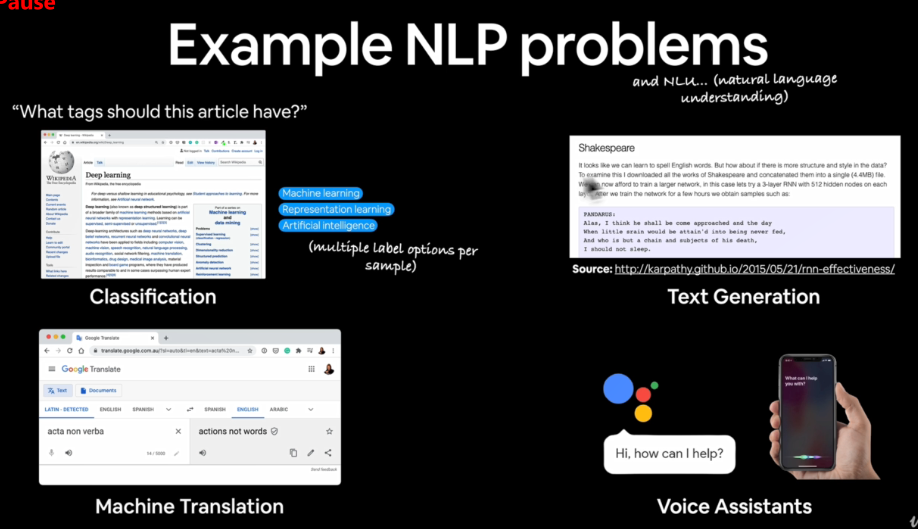

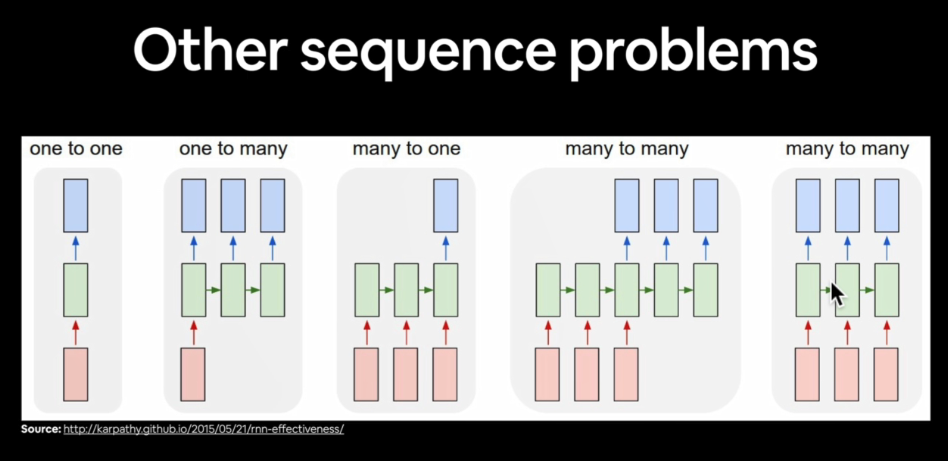

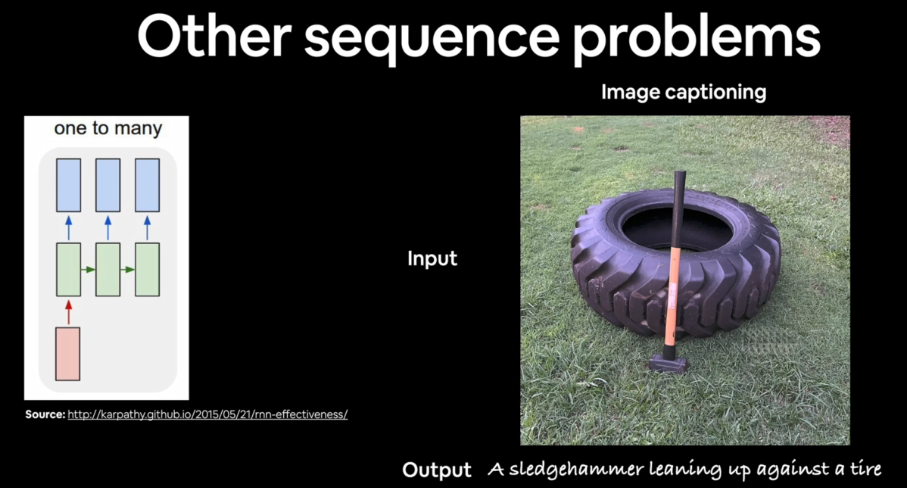

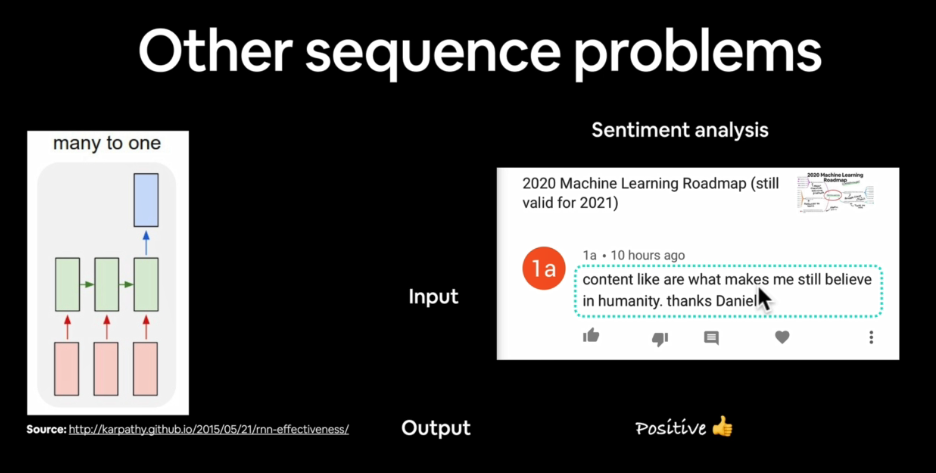

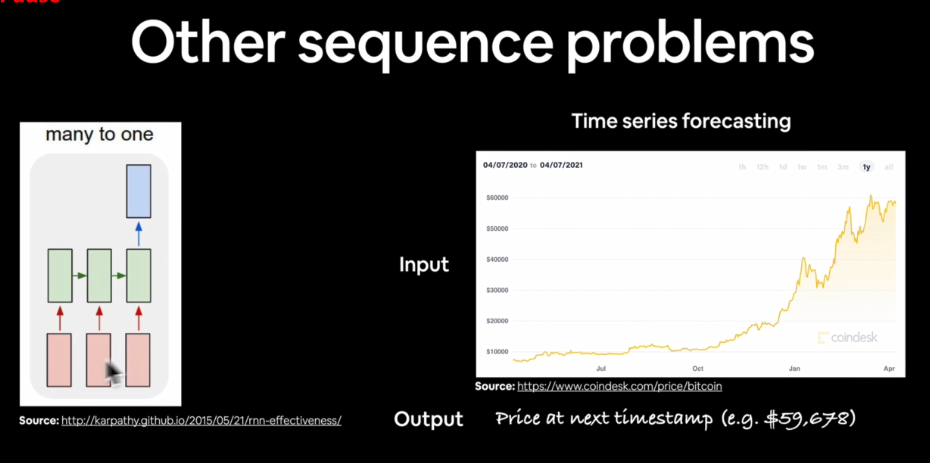

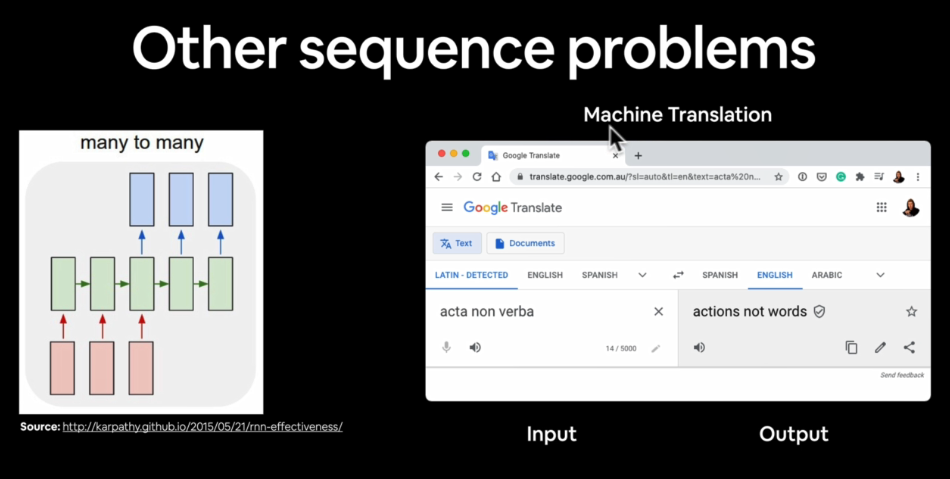

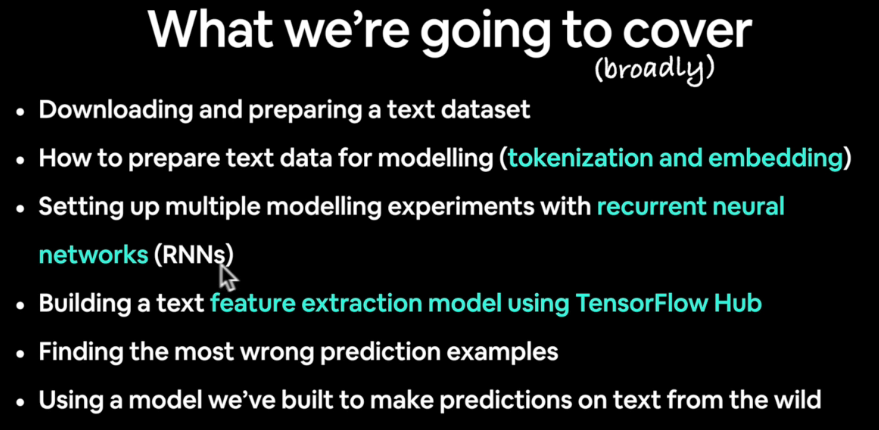

<h1 style="color:red">lec 003:-Example NLP inputs and outputs</h1>

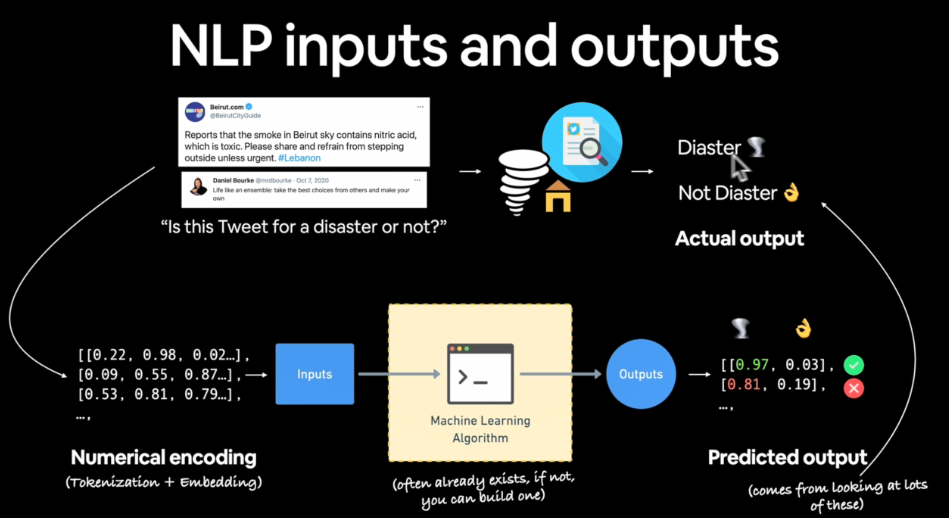

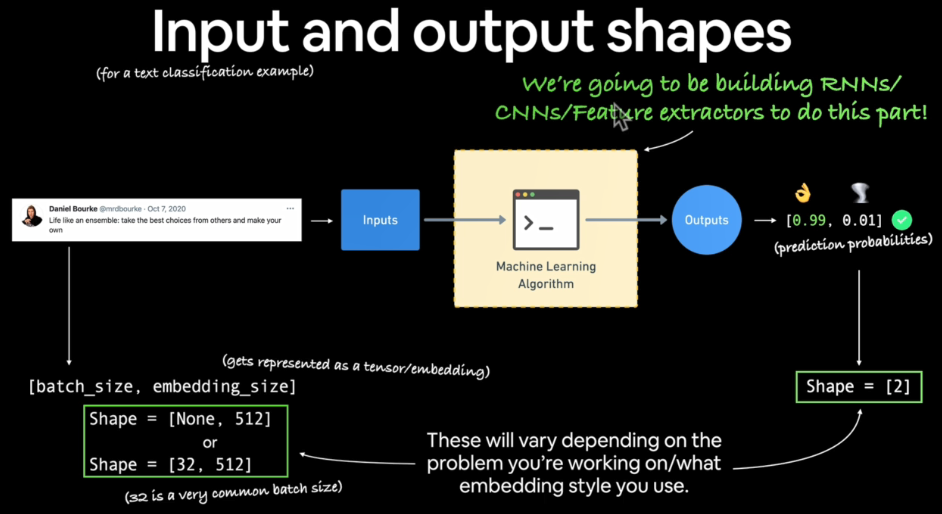

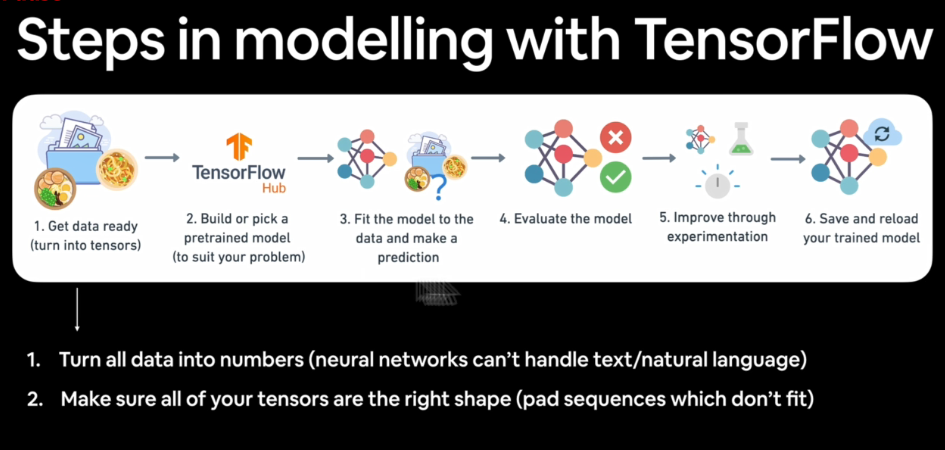

<h1 style="color:red">lec 004:-The typical architecture of a Recurrent Neural Network (RNN)</h1>

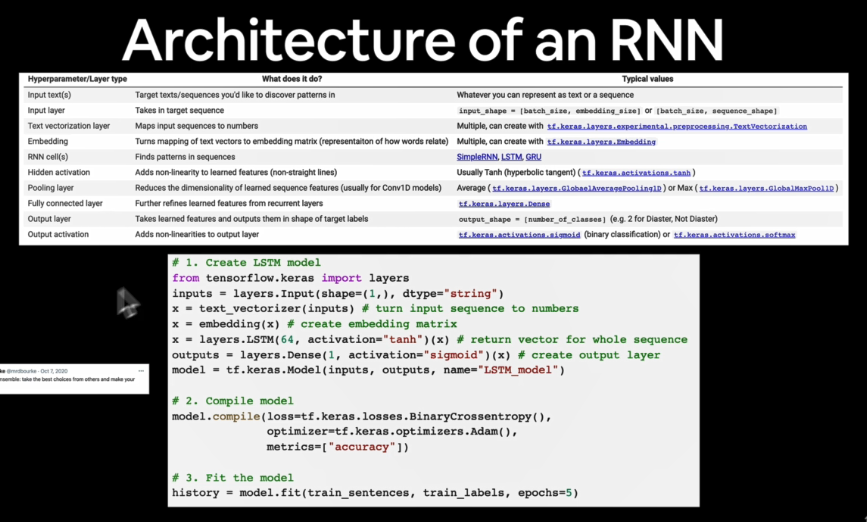

In TensorFlow / Keras, `layers.LSTM` stands for:

**Long Short-Term Memory**

It is a type of **Recurrent Neural Network (RNN)** designed to remember information over long sequences and avoid the **vanishing gradient problem**.

Structure components inside an LSTM cell:

* **Forget Gate** – decides what information to discard from previous memory.
* **Input Gate** – decides what new information to store.
* **Cell State** – long-term memory that flows through the sequence.
* **Output Gate** – decides what part of memory to output.

Typical usage:

```python
from tensorflow.keras import layers

model.add(layers.LSTM(128))
```

Meaning: an LSTM layer with **128 memory units** that processes sequential data such as text, time series, or speech.


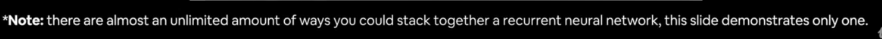

word2vec embedding example king queen

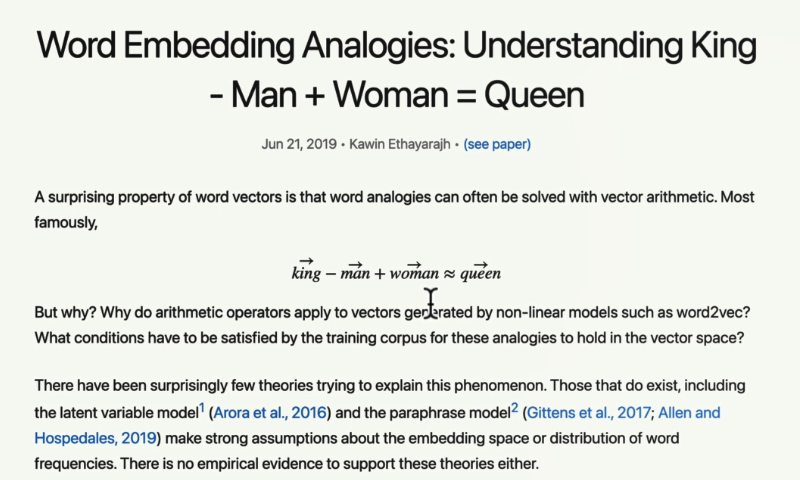

<h1 style="color:red">lec 005:-Preparing a notebook for our first NLP with TensorFlow project</h1>

# Introduction to NLP fundamentals in TensorFlow

NLP has the goal of deriving information out of natural languages (could be sequence text or speech).

Another common term for NLP problems is sequence to sequence problems (seq2seq).


## Check for GPU

In [1]:
!nvidia-smi -L

/bin/bash: line 1: nvidia-smi: command not found


## Get helper functions

In [1]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

# Import series of helper functions for the notebook
from helper_functions import unzip_data, create_tensorboard_callback, plot_loss_curves, compare_historys

--2026-03-20 12:25:32--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2026-03-20 12:25:32 (90.4 MB/s) - ‘helper_functions.py’ saved [10246/10246]



## Get a text dataset

The dataset we're going to be using is Kaggle's introduction to NLP dataset (text samples of Tweets labelled as disaster or not disaster).

See the original source here: https://www.kaggle.com/c/nlp-getting-started

In [2]:
!wget https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip

# Unzip data
unzip_data("nlp_getting_started.zip")

--2026-03-20 12:25:41--  https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.12.207, 74.125.26.207, 172.217.204.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.12.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 607343 (593K) [application/zip]
Saving to: ‘nlp_getting_started.zip’

nlp_getting_started 100%[===================>] 593.11K  --.-KB/s    in 0.005s  

2026-03-20 12:25:41 (119 MB/s) - ‘nlp_getting_started.zip’ saved [607343/607343]



<h1 style="color:red">lec 006:-Becoming one with the data and visualising a text dataset</h1>

## Visualizing a text dataset

To visualize our text samples, we first have to read them in, one way to do so would be to use Python: https://realpython.com/read-write-files-python/

But i prefer to get visual straight away.

So another way to do this is with pandas

But there's a problem right now our text datasets are small but what if they are in GBs then what?

so there's another way to do it [Tensorflow text imports(Load text)](https://www.tensorflow.org/tutorials/load_data/text)

In [3]:
import pandas as pd

train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")
train_df.head()

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [4]:
train_df.iloc[0]

,0
id,1
keyword,NaN
location,NaN
text,Our Deeds are the Reason of this #earthquake M...
target,1


In [5]:
train_df["text"][0]

'Our Deeds are the Reason of this #earthquake May ALLAH Forgive us all'

In [6]:
# Shuffle training data
# although we have downloaded the shuffle data it's good practice to shuffle the data so our model doesn't learn based on any order

train_df_shuffled = train_df.sample(frac = 1, random_state = 42)
train_df_shuffled.head()

,id,keyword,location,text,target
2644,3796,destruction,NaN,So you have a new weapon that can cause un-ima...,1
2227,3185,deluge,NaN,The f$&amp;@ing things I do for #GISHWHES Just...,0
5448,7769,police,UK,DT @georgegalloway: RT @Galloway4Mayor: ÛÏThe...,1
132,191,aftershock,NaN,Aftershock back to school kick off was great. ...,0
6845,9810,trauma,"Montgomery County, MD",in response to trauma Children of Addicts deve...,0


In [7]:
# What does the test dataframe look like?
test_df.head() # there isn't any label column

,id,keyword,location,text
0,0,NaN,NaN,Just happened a terrible car crash
1,2,NaN,NaN,"Heard about #earthquake is different cities, s..."
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan


In [8]:
# How many examples of each class?
train_df.target.value_counts()

,count
target,
0,4342
1,3271


[search on google tensorflow imbalance classification dataset](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data)

In [9]:
# How many total samples
len(train_df), len(test_df)

(7613, 3263)

In [10]:
# Let's visualize some random training examples
import random
random_index = random.randint(0, len(train_df)-5) # Create random indexes not higher than the total number of samples
for row in train_df_shuffled[["text","target"]][random_index:random_index+5].itertuples():
  _,text,target = row # underscore for index because it always return index
  print(f"Target: {target}", "(real disaster)" if target > 0 else "(not real disaster)")
  print(f"Text:\n{text}\n")
  print("---\n")

Target: 0 (not real disaster)
Text:
Homemade frozen yogurt pops? Have you had luck making them? http://t.co/YzaZF4CEOa http://t.co/X5RC5Nuamh

---

Target: 1 (real disaster)
Text:
@Zak_Bagans this is Sabrina my dad rescued her from some dude who kept her in a cage. We've had her since I was 4 http://t.co/1k2PhQcuW8

---

Target: 1 (real disaster)
Text:
PAGASA 7:12am: YELLOW warning - Panay Island Guimaras Negros. Possible floods in low-lying areas &amp; landslides in mountainous areas.

---

Target: 0 (not real disaster)
Text:
A new favorite: Trivium - Detonation by @rrusa https://t.co/cubdNsNuvt on #SoundCloud

---

Target: 1 (real disaster)
Text:
Typhoon Soudelor was captured in this incredible NASA photo on it's way to Taiwan! http://t.co/dGGm5b0w4L http://t.co/eYr2Xx5l1p

---



<h1 style="color:red">lec 007:-Splitting data into training and validation sets</h1>

### Split data into training and validation sets

In [11]:
from sklearn.model_selection import  train_test_split

In [12]:
# Use train_test_split to split training data into training and validation sets
# train_test_split expect things in numpy arrays
train_sentences, val_sentences, train_labels, val_labels = train_test_split(train_df_shuffled["text"].to_numpy(),
                                                                            train_df_shuffled["target"].to_numpy(),
                                                                            test_size =0.1, # use 10% of training data for validation split
                                                                            random_state = 42)

In [14]:
# Check the lengths
len(train_sentences), len(train_labels), len(val_sentences), len(val_labels)

(6851, 6851, 762, 762)

In [15]:
# Check the first 10 samples
train_sentences[:10], train_labels[:10]

(array(['@mogacola @zamtriossu i screamed after hitting tweet',
        'Imagine getting flattened by Kurt Zouma',
        '@Gurmeetramrahim #MSGDoing111WelfareWorks Green S welfare force ke appx 65000 members har time disaster victim ki help ke liye tyar hai....',
        "@shakjn @C7 @Magnums im shaking in fear he's gonna hack the planet",
        'Somehow find you and I collide http://t.co/Ee8RpOahPk',
        '@EvaHanderek @MarleyKnysh great times until the bus driver held us hostage in the mall parking lot lmfao',
        'destroy the free fandom honestly',
        'Weapons stolen from National Guard Armory in New Albany still missing #Gunsense http://t.co/lKNU8902JE',
        '@wfaaweather Pete when will the heat wave pass? Is it really going to be mid month? Frisco Boy Scouts have a canoe trip in Okla.',
        'Patient-reported outcomes in long-term survivors of metastatic colorectal cancer - British Journal of Surgery http://t.co/5Yl4DC1Tqt'],
       dtype=object),
 array([0,

<h1 style="color:red">lec 008:-Converting text data to numbers using tokenisation and embeddings (overview)</h1>

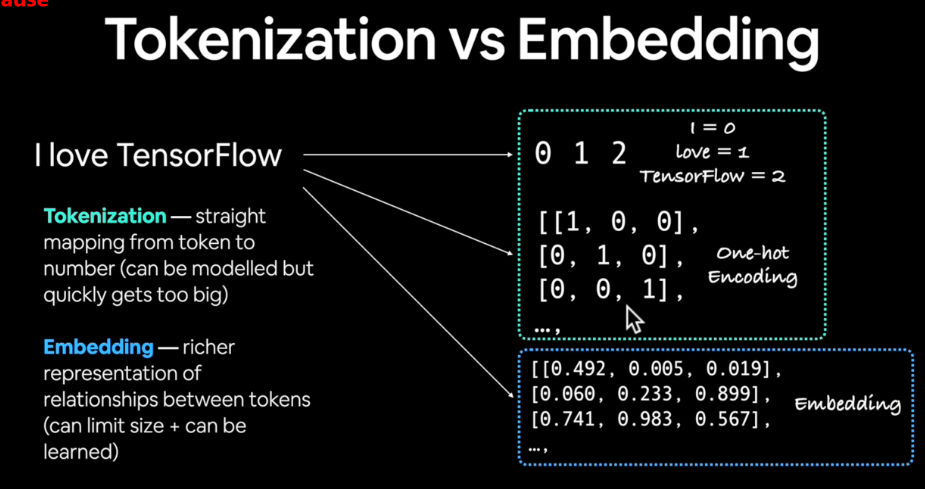

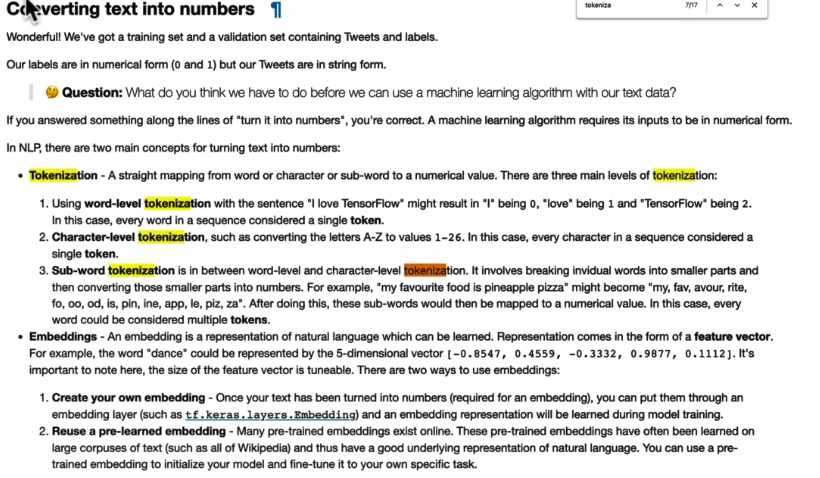

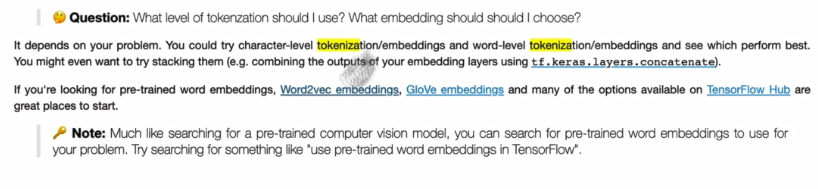

https://www.tensorflow.org/text/guide/word_embeddings

## Converting text into numbers

When dealing with a text problem, one of the first things you'll have to do before you can build a model is to convert your text to numbers.

There are a few ways to do this, namely:
* Tokenization - direct mapping of token (a token could be a word of character) to number.
* Embedding - create a matrix of feature vector for each token (the size of the feature vector can be defined and this embedding can be learned)

### Theoretical understanding of TextVectorization layer with the help of chatgpt

#### hehe
A **Text Vectorization Layer** converts **raw text into numerical vectors** so machine learning models can process language. Neural networks cannot operate on strings; they require numbers. This layer performs the preprocessing pipeline automatically.

In modern deep-learning workflows it is commonly used in **TensorFlow** through the **Keras** `TextVectorization` layer.

---

# Core Idea

Input to a model:

```
"I love machine learning"
```

The model cannot understand this directly.
The vectorization layer converts it into integer tokens or vectors.

Example output:

```
[15, 4, 88, 102]
```

Each number corresponds to a **word index in a vocabulary**.

---

# What the Layer Actually Does

The layer usually performs several preprocessing steps internally.

Typical pipeline:

```
Text
 ↓
Normalization
 ↓
Tokenization
 ↓
Vocabulary mapping
 ↓
Vector output
```

---

# Step 1 — Normalization

The text is standardized.

Operations often include:

```
lowercasing
removing punctuation
stripping extra whitespace
unicode normalization
```

Example:

```
"I LOVE AI!!!"
```

becomes

```
i love ai
```

---

# Step 2 — Tokenization

The text is split into smaller units called **tokens**.

Example:

```
i love machine learning
```

tokens:

```
["i", "love", "machine", "learning"]
```

Tokenization can be:

| Type                   | Meaning             |
| ---------------------- | ------------------- |
| word tokenization      | split by words      |
| character tokenization | split by characters |
| subword tokenization   | BPE / WordPiece     |

The Keras text vectorization layer typically uses **word tokenization**.

---

# Step 3 — Vocabulary Creation

The layer builds a **vocabulary dictionary** mapping tokens to numbers.

Example vocabulary:

```
{
 "<pad>": 0
 "<unk>": 1
 "i": 2
 "love": 3
 "machine": 4
 "learning": 5
}
```

Unknown words map to:

```
<unk>
```

---

# Step 4 — Integer Encoding

Tokens are converted to numeric IDs.

Example sentence:

```
i love machine learning
```

becomes:

```
[2, 3, 4, 5]
```

These integers represent words.

---

# Step 5 — Padding / Length Control

Models require **fixed-length input**.

Example:

```
max_length = 6
```

Sentence:

```
i love ai
```

becomes:

```
[2, 3, 6, 0, 0, 0]
```

Where `0` is the padding token.

---

# Using TextVectorization in Practice

Example implementation.

```python
from tensorflow.keras.layers import TextVectorization

vectorize_layer = TextVectorization(
    max_tokens=10000,
    output_mode="int",
    output_sequence_length=10
)
```

Parameters:

| Parameter              | Meaning               |
| ---------------------- | --------------------- |
| max_tokens             | vocabulary size limit |
| output_mode            | type of vector output |
| output_sequence_length | fixed sequence length |

---

# Adapting the Vocabulary

The layer must **learn vocabulary from training data**.

```
vectorize_layer.adapt(dataset)
```

This scans the dataset and builds the word index.

---

# Example Workflow

Dataset:

```
[
 "i love ai",
 "ai loves data",
 "machine learning is powerful"
]
```

Adapt step builds vocabulary.

Then transforming text:

```
vectorize_layer(["i love ai"])
```

Output:

```
[[2, 3, 6, 0, 0, 0, 0, 0, 0, 0]]
```

---

# Output Modes

The layer can produce different types of vector representations.

### 1 Integer encoding

```
[5, 12, 8, 0, 0]
```

Used with **embedding layers**.

---

### 2 Binary vector

Represents presence of words.

```
[0,1,0,1,0,1,0]
```

Equivalent to **bag-of-words presence**.

---

### 3 Count vector

Counts occurrences.

```
[0,2,0,1,0]
```

Used in traditional ML.

---

### 4 TF-IDF vector

Weighting based on importance.

```
tf-idf score vector
```

Used in classical NLP pipelines.

---

# Integration with Neural Networks

Typical architecture:

```
Text Input
   ↓
TextVectorization
   ↓
Embedding Layer
   ↓
Neural Network
```

Example model:

```python
model = Sequential([
    vectorize_layer,
    Embedding(10000, 128),
    GlobalAveragePooling1D(),
    Dense(64, activation="relu"),
    Dense(1, activation="sigmoid")
])
```

---

# Why It Is Useful

Before this layer existed, preprocessing required:

```
tokenizer
vocabulary building
padding
encoding
```

All done manually.

TextVectorization combines everything into **one preprocessing layer**.

Benefits:

| Advantage                | Explanation                      |
| ------------------------ | -------------------------------- |
| simpler pipelines        | fewer preprocessing scripts      |
| model portability        | preprocessing saved inside model |
| GPU compatibility        | runs inside training graph       |
| consistent preprocessing | training and inference identical |

---

# Limitations

Despite its convenience, it has limitations.

### Limited tokenization

It does not support advanced tokenization like:

```
BPE
SentencePiece
WordPiece
```

which are used by transformer models.

---

### Not ideal for pretrained models

Large NLP systems like **BERT** use specialized tokenizers.

---

# When It Is Typically Used

TextVectorization is common for:

```
sentiment analysis
text classification
spam detection
topic classification
chatbot intent detection
```

It is most suitable for **custom neural network NLP models**.

---

# Conceptual Summary

A **text vectorization layer** transforms human language into numerical format usable by neural networks by performing:

```
normalization
tokenization
vocabulary mapping
integer encoding
padding
```

The result is a structured numeric representation that allows machine learning models to learn patterns from text.


### Practical understanding of arguments of TextVectorization with the help of chatgpt

In [16]:
import tensorflow as tf
tf.keras.layers.TextVectorization(
    max_tokens=None,
    standardize='lower_and_strip_punctuation',
    split='whitespace',
    ngrams=None,
    output_mode='int',
    output_sequence_length=None,
    pad_to_max_tokens=False,
    vocabulary=None,
    idf_weights=None,
    sparse=False,
    ragged=False,
    encoding='utf-8',
    name=None,
    # **kwargs
)

<TextVectorization name=text_vectorization, built=False>

#### hehe

# TextVectorization Layer Arguments

`TextVectorization` converts raw text into numerical form for neural networks.
It is provided in **TensorFlow / Keras** as a preprocessing layer.

---

# 1. `max_tokens`

Defines the **maximum vocabulary size**.

```python
max_tokens = 10000
```

Meaning:

* Only the **10,000 most frequent words** are kept.
* Rare words are mapped to an **unknown token**.

Practical use:

* Small dataset → `5000–10000`
* Medium dataset → `20000`
* Large dataset → `50000+`

---

# 2. `standardize`

Controls **text cleaning before tokenization**.

Default:

```python
standardize="lower_and_strip_punctuation"
```

This does:

* Convert text to lowercase
* Remove punctuation

Example:

```
"Hello!!! World"
```

becomes

```
hello world
```

Options:

| Value                         | Meaning                        |
| ----------------------------- | ------------------------------ |
| `lower_and_strip_punctuation` | lowercase + remove punctuation |
| `lower`                       | only lowercase                 |
| `strip_punctuation`           | only remove punctuation        |
| `None`                        | no preprocessing               |

---

# 3. `split`

Defines **how text is split into tokens**.

Default:

```python
split="whitespace"
```

Example:

```
"I love AI"
```

Tokens:

```
["I", "love", "AI"]
```

Options:

| Value        | Meaning               |
| ------------ | --------------------- |
| `whitespace` | split using spaces    |
| `character`  | split into characters |
| `None`       | no splitting          |

---

# 4. `ngrams`

Creates **word combinations**.

Example:

```python
ngrams = 2
```

Sentence:

```
I love AI
```

Tokens produced:

```
["I", "love", "AI", "I love", "love AI"]
```

Values:

| Value  | Meaning    |
| ------ | ---------- |
| `None` | no n-grams |
| `2`    | bigrams    |
| `3`    | trigrams   |

---

# 5. `output_mode`

Defines **type of vector output**.

Options:

| Mode     | Meaning                |
| -------- | ---------------------- |
| `int`    | integer token IDs      |
| `binary` | word presence          |
| `count`  | word frequency         |
| `tf-idf` | tf-idf weighted values |

Example (`int` mode):

```
"I love AI"
```

becomes

```
[15, 3, 120]
```

Most neural networks use:

```
output_mode="int"
```

---

# 6. `output_sequence_length`

Defines **fixed output length**.

Example:

```python
output_sequence_length = 10
```

Sentence:

```
"I love AI"
```

Output:

```
[2, 4, 7, 0, 0, 0, 0, 0, 0, 0]
```

Meaning:

* Short sequences → padded
* Long sequences → truncated

---

# 7. `pad_to_max_tokens`

Used only when `output_mode` is:

```
binary
count
tf-idf
```

Behavior:

| Value   | Meaning                       |
| ------- | ----------------------------- |
| `True`  | output size = `max_tokens`    |
| `False` | output size = vocabulary size |

Usually kept as:

```python
pad_to_max_tokens=False
```

---

# 8. `vocabulary`

Allows **manually defining vocabulary**.

Example:

```python
vocabulary=["i","love","ai","machine","learning"]
```

Meaning:

* Vocabulary is fixed
* `adapt()` step is not required

Useful when **loading trained models**.

---

# 9. `idf_weights`

Used only with:

```
output_mode="tf-idf"
```

Provides **precomputed tf-idf weights**.

Usually not required unless restoring a trained model.

---

# 10. `sparse`

Controls output tensor format.

| Value   | Meaning                      |
| ------- | ---------------------------- |
| `False` | dense tensor (normal arrays) |
| `True`  | sparse tensor                |

Most models use:

```python
sparse=False
```

---

# 11. `ragged`

Controls sequence padding behavior.

| Value   | Meaning                       |
| ------- | ----------------------------- |
| `False` | fixed-length padded sequences |
| `True`  | variable-length sequences     |

Example ragged output:

```
[[2,4,5],
 [7,8],
 [3]]
```

Most neural networks require:

```python
ragged=False
```

---

# 12. `encoding`

Defines text encoding.

Default:

```python
encoding="utf-8"
```

Usually unchanged.

---

# 13. `name`

Optional layer name.

Example:

```python
name="text_vectorizer"
```

Useful for model readability.

---

# 14. `**kwargs`

Additional arguments inherited from Keras layers (e.g., `dtype`, `trainable`).
Rarely used with `TextVectorization`.

---

# Practical Example

Typical configuration for text classification:

```python
vectorizer = tf.keras.layers.TextVectorization(
    max_tokens=20000,
    standardize="lower_and_strip_punctuation",
    split="whitespace",
    output_mode="int",
    output_sequence_length=200
)
```

Pipeline:

```
Raw Text
   ↓
TextVectorization
   ↓
Integer Tokens
   ↓
Embedding Layer
   ↓
Neural Network
```

---

# Minimal Parameters Usually Needed

In most projects only these parameters are changed:

```
max_tokens
output_mode
output_sequence_length
standardize
```

Example:

```python
TextVectorization(
    max_tokens=20000,
    output_mode="int",
    output_sequence_length=200
)
```


### Text vectorization (tokenization)

In [17]:
train_sentences[:5]

array(['@mogacola @zamtriossu i screamed after hitting tweet',
       'Imagine getting flattened by Kurt Zouma',
       '@Gurmeetramrahim #MSGDoing111WelfareWorks Green S welfare force ke appx 65000 members har time disaster victim ki help ke liye tyar hai....',
       "@shakjn @C7 @Magnums im shaking in fear he's gonna hack the planet",
       'Somehow find you and I collide http://t.co/Ee8RpOahPk'],
      dtype=object)

Input word ->
Check vocabulary->
If not present → OOV ->
Replace with \<UNK>

In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import TextVectorization

# Use the default TextVectorization parameters
text_vectorizer = TextVectorization(max_tokens=None, # how many words in the vocubalary (automatically ad <OOV> [out of vocublary])
                                    standardize="lower_and_strip_punctuation",
                                    split="whitespace",
                                    ngrams=None, # group of n-words?
                                    output_mode="int", # how to map tokens to numbers
                                    output_sequence_length=None, # how long should the output sequence of tokens be?
                                    pad_to_max_tokens=False # if max_tokens = none then we don't have to put pad_to_max_tokens = False because in false it's always equal to vocublary size and max_tokens=None means max_tokens = vocubalary size
                                    )

In [19]:
len(train_sentences[0].split())

7

In [20]:
# Find the average number of tokens (words) in the training tweets
round(sum([len(i.split()) for i in train_sentences])/len(train_sentences))

15

In [14]:
# Setup text vectorization variables
max_vocab_length = 10000 # max number of words to have in our vocabulary
max_length = 15 # max length our sequences will be (e.g. how many words from a tweet does a model see?)

text_vectorizer = TextVectorization(max_tokens = max_vocab_length,
                                    output_mode="int",
                                    output_sequence_length=max_length)

<h1 style="color:red">lec 010:-Mapping the TextVectorization layer to text data and turning it into numbers</h1>

In [15]:
# Fit the text vectorizer to the training text
text_vectorizer.adapt(train_sentences) # validation and test are from future so dont't adapt it on them

In [23]:
# Create a sample sentence and tokenize it
sample_sentence = "There's a flood in my street!"
text_vectorizer([sample_sentence]) # it's length is 15 = max_length parameter we passed


<tf.Tensor: shape=(1, 15), dtype=int64, numpy=
array([[264,   3, 232,   4,  13, 698,   0,   0,   0,   0,   0,   0,   0,
          0,   0]])>

In [24]:
# Choose a random sentence from the training dataset and tokenize it
import random
random_sentence = random.choice(train_sentences)
vectorized_random_sentence = text_vectorizer([random_sentence])

print(f"Original text:\n {random_sentence}\n\nVectorized version:\n{vectorized_random_sentence}")

Original text:
 Cancers equate for around 25% of all deaths in #Blackpool. 

Kowing the signs could save your life: http://t.co/5lNIdvoBff
#BeClearOnCancer

Vectorized version:
[[6030 5714   10  470  867    6   44  401    4 6092 5263    2  809  137
   328]]


In [25]:
# Get the unique wprds in the vocabulary
words_in_vocab = text_vectorizer.get_vocabulary() # get all of the unique words in our training data
top_5_words = words_in_vocab[:5] # get the most common words
bottom_5_words = words_in_vocab[-5:] # get the least common words
print(f"Number of words in vocab: {len(words_in_vocab)}")
print(f"Top 5 most common words: {top_5_words}")
print(f"Top 5 least common words: {bottom_5_words}")

Number of words in vocab: 10000
Top 5 most common words: ['', '[UNK]', np.str_('the'), np.str_('a'), np.str_('in')]
Top 5 least common words: [np.str_('pages'), np.str_('paeds'), np.str_('pads'), np.str_('padres'), np.str_('paddytomlinson1')]


>**Note:** if we increase or max_tokens value our [UNK] tokens will be less

<h1 style="color:red">lec 011:-Creating an Embedding layer to turn tokenised text into embedding vectors</h1>

### Creating an Embedding using an Embedding Layer

To make our embedding, we're going to use TensorFlow's embedding layer: https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding

The parameters we care most about for our embedding layer:
* `input_dim` = the size of our vocabulary
* `output_dim` = the size of the output embedding vector, for example, a value of 100 would mean each token gets represented by a vector 100 long
* `input_length` = length of the sequences being passed to the embedding layer


In [16]:
from tensorflow.keras import layers

embedding = layers.Embedding(input_dim=max_vocab_length, # set input shape
                             output_dim = 128, # set output shape # numbers divisible by 8 usually work well with GPUs
                             embeddings_initializer = "uniform",
                             input_length = max_length # how long is each input
                             )
embedding

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


<Embedding name=embedding, built=False>

In [27]:
# Get a random sentence from the training set
random_sentence = random.choice(train_sentences)
print(f"Original text:\n {random_sentence}\
        \n\nEmbedded version:")

# Embed the random sentences (turn it into dense vectors of fixed size)
sample_embed = embedding(text_vectorizer([random_sentence]))
sample_embed # every 15 words in that random sentence are in form of 128 size vectors

Original text:
 San Jose Mercury: Governor Brown allows parole for California school bus hijacker  http://t.co/GpCeCp9kHv        

Embedded version:


<tf.Tensor: shape=(1, 15, 128), dtype=float32, numpy=
array([[[-0.02725818, -0.00861645, -0.02578117, ..., -0.01848177,
          0.03223581,  0.01306701],
        [ 0.03885539, -0.02889072, -0.03124793, ...,  0.04330886,
         -0.04406475, -0.00722135],
        [-0.02432626,  0.0285502 , -0.02633911, ...,  0.045034  ,
         -0.02234502, -0.027341  ],
        ...,
        [ 0.00471543, -0.02110599,  0.03013004, ..., -0.00265825,
          0.04599608, -0.02942147],
        [-0.01263357,  0.04914905, -0.0442521 , ...,  0.04558292,
         -0.02688922, -0.04337486],
        [-0.01263357,  0.04914905, -0.0442521 , ...,  0.04558292,
         -0.02688922, -0.04337486]]], dtype=float32)>

In [28]:
# Check out a single token's embedding
sample_embed[0][0], sample_embed[0][0].shape, random_sentence[0]

(<tf.Tensor: shape=(128,), dtype=float32, numpy=
 array([-2.72581819e-02, -8.61644745e-03, -2.57811677e-02, -3.31238993e-02,
        -8.15153122e-04,  4.05209325e-02, -1.23970993e-02,  4.57108133e-02,
         2.00619362e-02, -8.83739069e-03, -8.41204077e-03,  1.97753645e-02,
        -3.54525819e-02, -1.95489526e-02,  1.39548890e-02,  4.75359447e-02,
         4.35680784e-02,  2.19371431e-02,  3.32753919e-02, -2.01732274e-02,
        -1.56920925e-02, -4.24613245e-02, -3.18825021e-02, -2.45532878e-02,
         4.61940505e-02,  1.71073414e-02,  2.97377594e-02,  3.44480611e-02,
        -2.50895619e-02, -6.34200498e-03, -4.39880602e-02, -4.66011874e-02,
        -1.97774768e-02,  3.38835754e-02,  2.06382535e-02, -4.02369499e-02,
        -3.01912315e-02,  8.59890133e-03, -7.01894611e-03,  4.22975905e-02,
         1.12573989e-02, -2.00362932e-02,  4.42832746e-02, -1.64165869e-02,
        -2.73212790e-05, -3.60907316e-02,  4.02109958e-02, -3.49719897e-02,
        -3.08091771e-02,  1.40721835e-0

> **Note:** as our model learns these numbers are going to get better in representing our words

<h1 style="color:red">lec 012:-Discussing the various modelling experiments we're going to run</h1>

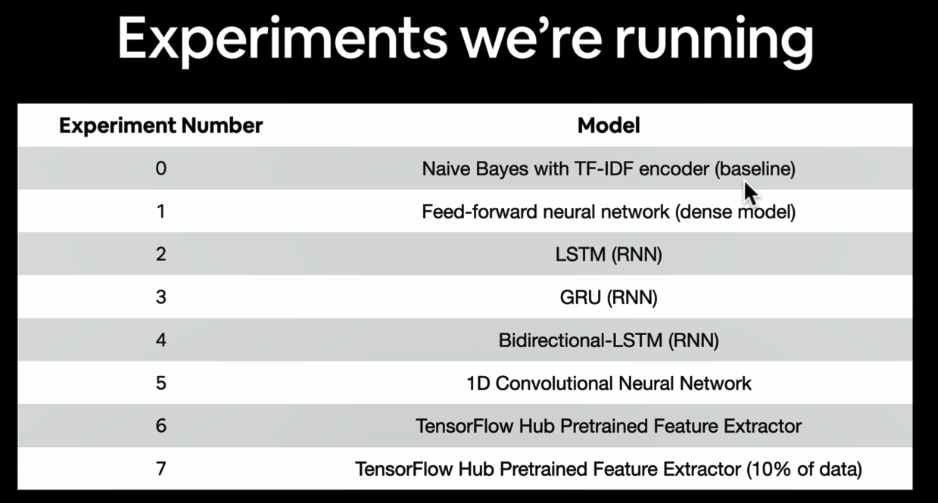

>**Note:** Before building deep learning model first start from a baseline model (maybe a scikit-learn model you can choose)

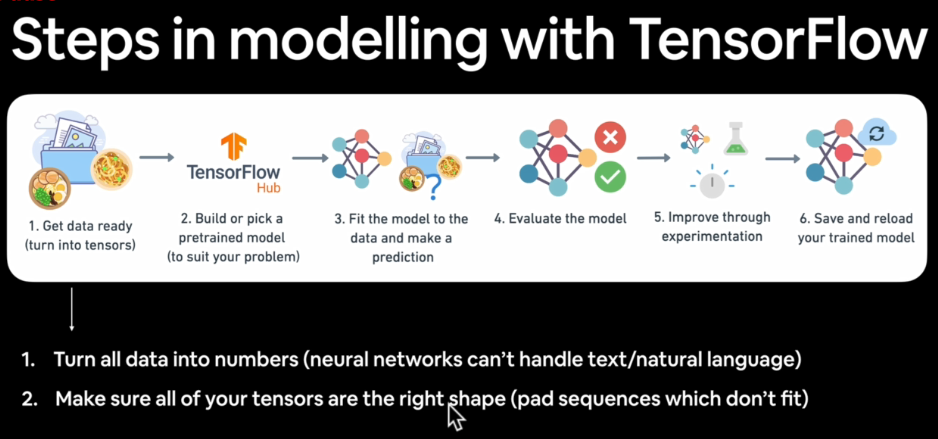

## Modelling a text dataset (running a series of experiments)

Now we've a got way to turn our text sequences into numbers, it's time to start building a series of modelling experiments.

We'll start with a baseline and move on from there.

* Model 0: Naive Bayes (baseline), this is from sklearn ML map: https://scikit-learn.org/stable/machine_learning_map.html
* Model 1: Feed-forward neural network (dense model)
* Model 2: LSTM model (RNN)
* Model 3: GRU model (RNN)
* Model 4: Bidirectional-LSTM model (RNN)
* Model 5: 1D Convolutional Neural Network (CNN)
* Model 6: TensorFlow Hub Pretrained Feature Extractor (using transfer learning for NLP)
* Model 7: Same a model 6 with 10% of training data

How are we going to approach all of these?

Use the standard steps in modelling with tensorflow:

* Create a model
* Build a model
* Fit a model
* Evaluate our model

**Challenge:** try sklearn naive bayse text classifier with tf idf by yourself

<h1 style="color:red">lec 013:-Model 0_ Building a baseline model to try and improve upon</h1>

### Model 0: Getting a baseline

As with all machine learning modelling experiments, it's important to create baseline model so you've got a benchmark for future experiments to build upon.

To create our baseline, we'll use Sklearn's Multinomial Naive Bayes using the TF-IDF formula to convert our words to numbers.

>🔑**Note:** It's common practice to use non-DL algorithms as a baseline because of their speed and then later using DL to see if you can improve upon them.



Summary

TF-IDF measures word importance in a document relative to the dataset.


```
TF → word frequency in document
IDF → rarity across documents
TF-IDF → importance score
```



Result:



```
rare + frequent in document → high weight
common everywhere → low weight
```



In [58]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

# Create tokenization and modelling pipeline
model_0 = Pipeline([
                    ("tfidf",TfidfVectorizer()), # converts words to numbers using tfidf
                    ("clf",MultinomialNB()) # model the text
])

# Fit the pipeline to the training data
model_0.fit(train_sentences,train_labels)

Pipeline(steps=[('tfidf', TfidfVectorizer()), ('clf', MultinomialNB())])

In [59]:
# Evaluate our baseline model
baseline_score = model_0.score(val_sentences, val_labels) # default score matrix is accuracy
print(f"Our baseline model achieves an accuracy of: {baseline_score*100:.2f}%")


Our baseline model achieves an accuracy of: 79.27%


In [60]:
train_df.target.value_counts()

,count
target,
0,4342
1,3271


In [61]:
# Make predictions
baseline_preds = model_0.predict(val_sentences)
baseline_preds[:20]

array([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1])

In [33]:
val_labels[:20]

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0])

<h1 style="color:red">lec 014:-Creating a function to track and evaluate our model's results</h1>

### Creating an evaluation function for our model experiments

We could evaluate all of our model's predictions with different metrocs every time, however, this will be cumbersome and could easily be fixed with a function.

Let's create one to compare our model's predictions with the truth labels using the following metrics:
* Accuracy
* Precision
* Recall
* F1-score

For a deep overview of many different evaluation methods, see the Sklearn documentation: https://scikit-learn.org/0.15/modules/model_evaluation.html



In [31]:
# Function to evaluate: accuracy, precision, recall, f1-score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

def calculate_results(y_true, y_pred):
  """
  y_true: list of true labels
  y_pred: list of predicted labels
  Calculate model accuracy, precision, recall and f1 score of a binary classification model.
  """
  model_accuracy = accuracy_score(y_true, y_pred) * 100
  # Calculate model precision, recall and f1-score using "weighted" average
  model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted")
  model_results = {"accuracy": model_accuracy,
                  "precision": model_precision,
                   "recall":model_recall,
                   "f1": model_f1}

  return model_results

In [62]:
# Get baseline results
baseline_results = calculate_results(y_true=val_labels,
                                    y_pred=baseline_preds)
baseline_results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

<h1 style="color:red">lec 015:-Model 1_ Building, fitting and evaluating our first deep model on text data</h1>

### Why we add pooling layer?

#### hehe
### Why a Pooling Layer is Added (Summary)

After the **TextVectorization** and **Embedding** layers, the tensor shape is:

```
(batch_size, sequence_length, embedding_dim)
```

Example in your pipeline:

```
(batch, 15, 128)
```

Meaning:

* **15** → number of tokens in the sentence
* **128** → embedding vector size per token

So the model has **one embedding vector per word**, not one vector for the whole sentence.

---

### Problem Without Pooling

If you directly apply `Dense(1)`:

```
Dense operates on each timestep
```

Output becomes:

```
(batch, 15, 1)
```

Meaning the model predicts **15 outputs per sentence**, but your labels are:

```
(batch,)
```

→ **1 label per sentence**

This shape mismatch causes the training error.

---

### What Pooling Does

A pooling layer **reduces the sequence dimension** and converts multiple token vectors into a **single sentence vector**.

Example with `GlobalAveragePooling1D`:

```
(batch, 15, 128)
        ↓
(batch, 128)
```

It averages all token embeddings:

```
sentence_vector = mean(all word vectors)
```

---

### Result

After pooling:

```
(batch, 128)
      ↓
Dense(1)
      ↓
(batch, 1)
```

Now the model outputs **one prediction per sentence**, which matches the labels.

---

### One-Line Summary

Pooling is added to **compress token-level embeddings into a single sentence representation so the model can produce one prediction per input text**.


### where this batch comes from

#### hehe

The **batch dimension is automatically created by the training pipeline**, not by your model definition.

---

# Where the Batch Comes From

When you run:

```python
model_1.fit(
    x=train_sentences,
    y=train_labels,
    epochs=5
)
```

the training data:

```python
train_sentences.shape = (6851,)
train_labels.shape    = (6851,)
```

contains **6851 samples**.

Keras internally splits this dataset into **batches**.

Default batch size in **TensorFlow** is:

```text
32
```

So internally the training loop becomes something like:

```text
Batch 1 → 32 samples
Batch 2 → 32 samples
Batch 3 → 32 samples
...
```

---

# What a Batch Means

A **batch** is simply a small subset of the dataset processed together during one forward/backward pass.

Example:

Dataset:

```text
6851 sentences
```

With:

```python
batch_size = 32
```

Training steps per epoch:

```text
6851 / 32 ≈ 214 steps
```

Each step processes a tensor shaped like:

```text
(batch_size, ...)
```

---

# Why Models Always Show Batch Dimension

Deep learning layers are designed to process **multiple samples simultaneously**.

Even if you input one sample, the model still expects a batch dimension.

Example shapes:

| Meaning         | Shape      |
| --------------- | ---------- |
| single sentence | `(1, 15)`  |
| 32 sentences    | `(32, 15)` |

The first dimension is always:

```text
batch_size
```

---

# In Your Pipeline

Shape progression during training:

### Input

```text
(batch, )
```

Example:

```text
(32,)
```

### After TextVectorization

```text
(batch, 15)
```

### After Embedding

```text
(batch, 15, 128)
```

### After Pooling

```text
(batch, 128)
```

### After Dense

```text
(batch, 1)
```

---

# Can You Control Batch Size?

Yes.

Example:

```python
model.fit(
    train_sentences,
    train_labels,
    batch_size=64,
    epochs=5
)
```

Then the batch dimension becomes:

```text
(batch = 64)
```

---

# Key Concept

You **never define the batch dimension inside the model**.

Model input layers define **one sample**, while the training process adds the batch dimension automatically.

Conceptually:

```text
model expects → (sample_shape)
training provides → (batch_size, sample_shape)
```

---

# Final Summary

You didn't define the batch dimension because:

```text
Keras automatically adds it when training.
```

It represents **how many samples are processed simultaneously during each training step**.



### Model 1: A simple dense model

In [21]:
# Create a tensorboard callback (need to create a new one for each model)
from helper_functions import create_tensorboard_callback

# Create a directory to save Tensorboard logs
SAVE_DIR = "model_logs"

In [37]:
# Build model with the Functional API
from tensorflow.keras import layers
inputs = layers.Input(shape=(1,), dtype = "string") # inputs are 1-dimensional strings
x = text_vectorizer(inputs) # turn the input text into numbers
x = embedding(x) # create an embedding of the numberized inputs
x = layers.GlobalAveragePooling1D()(x)   # collapse sequence dimension, condense the feature vector for each token to one vector
# x = layers.Dense(8,activation="tanh")(x)  # causing overfitting
outputs = layers.Dense(1, activation="sigmoid",name="ouptut_layer")(x) # Create the output layer, want binary outputs so use sigmoid activation function

model_1 = tf.keras.Model(inputs, outputs, name="model_1_dense")


In [38]:
model_1.summary()

Model: "model_1_dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ouptut_layer (Dense)            │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,280,129 (4.88 MB)

 Trainable params: 1,280,129 (4.88 MB)

 Non-trainable params: 0 (0.00 B)

In [39]:
# Compile model
model_1.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics = ["accuracy"])

In [40]:
# Fit the model
model_1_history = model_1.fit(x=train_sentences,
                              y=train_labels,
                              epochs=5,
                              validation_data=(val_sentences,val_labels),
                              callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR,
                                                                     experiment_name="model_1_dense")])

Saving TensorBoard log files to: model_logs/model_1_dense/20260319-114632
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6983 - loss: 0.6075 - val_accuracy: 0.7598 - val_loss: 0.5373
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8140 - loss: 0.4441 - val_accuracy: 0.7887 - val_loss: 0.4761
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8587 - loss: 0.3514 - val_accuracy: 0.7887 - val_loss: 0.4612
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8879 - loss: 0.2892 - val_accuracy: 0.7913 - val_loss: 0.4696
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.9094 - loss: 0.2421 - val_accuracy: 0.7927 - val_loss: 0.4802


In [41]:
baseline_results, model_1.evaluate(val_sentences,val_labels)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7927 - loss: 0.4802 


({'accuracy': 79.26509186351706,
  'precision': 0.8111390004213173,
  'recall': 0.7926509186351706,
  'f1': 0.7862189758049549},
 [0.4801863729953766, 0.7926509380340576])

In [42]:
# Make some predictions and evaluate those
model_1_pred_probs = model_1.predict(val_sentences)
model_1_pred_probs.shape, model_1_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


((762, 1),
 array([[0.34825763],
        [0.7000378 ],
        [0.9978239 ],
        [0.10707153],
        [0.11035413],
        [0.940216  ],
        [0.91535324],
        [0.9926146 ],
        [0.9603408 ],
        [0.2238265 ]], dtype=float32))

>`tf.squeeze()` removes dimensions of size 1 from a tensor.

In [43]:
# Convert model prediction probabilities to label format
model_1_preds = tf.squeeze(tf.round(model_1_pred_probs))
model_1_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 0.], dtype=float32)>

In [44]:
# Calculate our model_1 results
model_1_results = calculate_results(y_true=val_labels,
                                    y_pred=model_1_preds)
model_1_results

{'accuracy': 79.26509186351706,
 'precision': 0.8002882489930304,
 'recall': 0.7926509186351706,
 'f1': 0.7889824348879467}

In [45]:
baseline_results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

In [46]:
import numpy as np
np.array(list(model_1_results.values())) > np.array(list(baseline_results.values()))

array([False, False, False,  True])

<h1 style="color:red">lec 016:-Visualising our model's learned word embeddings with TensorFlow's projector tool</h1>

## Visualizing learned embeddings

In [47]:
# Get the vocabulary from the text vectorization
words_in_vocab = text_vectorizer.get_vocabulary()
len(words_in_vocab), words_in_vocab[:10]

(10000,
 ['',
  '[UNK]',
  np.str_('the'),
  np.str_('a'),
  np.str_('in'),
  np.str_('to'),
  np.str_('of'),
  np.str_('and'),
  np.str_('i'),
  np.str_('is')])

In [48]:
model_1.summary() # to check embedding layer's name

Model: "model_1_dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ouptut_layer (Dense)            │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,840,389 (14.65 MB)

 Trainable params: 1,280,129 (4.88 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,560,260 (9.77 MB)

In [49]:
# Get the weight matrix of embedding layer
# (these are the numerical representations of each token in our training data, which have been learned for 5 epochs)
embed_weights = model_1.get_layer("embedding").get_weights()

embed_weights

[array([[ 1.7331621e-02,  7.6656260e-02, -4.5001250e-02, ...,
          7.6604784e-02,  2.4272031e-03, -1.3737387e-02],
        [ 1.3007088e-02, -1.3198638e-02,  4.3300621e-02, ...,
          4.4673556e-03,  5.3896688e-02, -2.0304697e-02],
        [-1.5116691e-02,  5.8544148e-02,  3.4195095e-02, ...,
          2.4735816e-02,  2.2948999e-02, -1.2445885e-02],
        ...,
        [-3.0465459e-02, -5.2072182e-03, -1.2383509e-02, ...,
         -3.6780514e-02, -1.7626666e-02, -1.0502562e-03],
        [ 7.2292769e-03, -8.0364254e-05,  6.9553822e-02, ...,
          2.7283333e-02,  3.4586880e-02,  5.9431069e-02],
        [ 8.8116720e-02,  3.1262107e-02,  7.4662656e-02, ...,
          9.7757697e-02,  6.2434014e-02,  3.1839181e-02]], dtype=float32)]

> **Note:** Remembers embed_weights have weights of embedding wraps in list so to get actual numpy array use [0] behind it

In [50]:
print(embed_weights[0].shape) # same size as vocab size and embedding_dim

(10000, 128)


Now we've got the embedding matrix our model has learned to represent our tokens, let's see how we can visualize it.

To do so, TensorFlow has a handy tool called projector: https://projector.tensorflow.org/

And TensorFlow also has an incredible guide on word embeddings themselves: https://www.tensorflow.org/text/guide/word_embeddings

and there is this jay alamaar's guide on embeddings: https://jalammar.github.io/illustrated-word2vec/

In [51]:
# Create embedding files (we got this from TensorFlow's word embeddings documentation)
import io
out_v = io.open('vectors.tsv', 'w', encoding='utf-8')
out_m = io.open('metadata.tsv', 'w', encoding='utf-8')

for index, word in enumerate(words_in_vocab):
  if index == 0:
    continue  # skip 0, it's padding.
  vec = embed_weights[0][index]
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
  out_m.write(word + "\n")
out_v.close()
out_m.close()

In [52]:
# Download files from Colab to upload to projector
try:
  from google.colab import files
  files.download('vectors.tsv')
  files.download('metadata.tsv')
except Exception:
  pass


# now go to tenserflow embeddings projector and upload vectors.tsv then metadata.tsv

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<h1 style="color:red">lec 017:-High-level overview of Recurrent Neural Networks (RNNs) + where to learn more</h1>

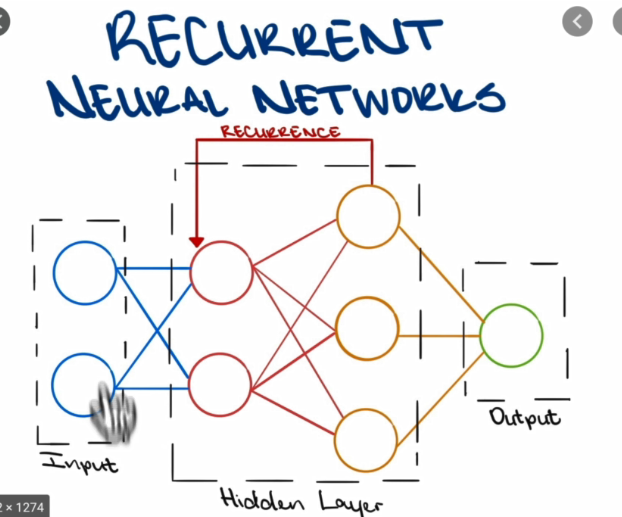

## Recurrent Neural Networks

RNN's are useful for sequence data.

The premise of a recurrent neural network is to use the representation of a previous input to aid the representation of a later input.

>✨**Resources:** If you want an overview of the internals of a recurrent neural network, see the following:
>* see the recurrent neural network's video from this playlist: https://youtube.com/playlist?list=PLtBw6njQRU-rwp5__7C0oIVt26ZgjG9NI&si=VrMBlhx3w7Gps6X6
>* for slides of that deep sequence modelling lecture: https://introtodeeplearning.com/slides/6S191_MIT_DeepLearning_L2.pdf
>* Chris Olah's intro to LSTMs : https://colah.github.io/posts/2015-08-Understanding-LSTMs/
>* Andrej Karpathy's the unreasonable effectiveness of recurrent neural networks: https://karpathy.github.io/2015/05/21/rnn-effectiveness/

<h1 style="color:red">lec 018:-Model 2_ Building, fitting and evaluating our first TensorFlow RNN model (LSTM)</h1>

### Model 2: LSTM

LSTM = long short term memory (one of the most popular LSTM cells)

Our structure of an RNN typically looks like this:

```
Input (text) -> Tokenize -> Embedding -> Layers (RNNs/dense) -> Output (label probability)

In [53]:
# Create an LSTM model
from tensorflow.keras import layers
inputs = layers.Input(shape=(1,),dtype="string")
x = text_vectorizer(inputs)
x = embedding(x)
# print(x.shape)
# x = layers.LSTM(64,return_sequences=True)(x) # when you're stacking RNN cells together, you need to set return_sequences = True
# print(x.shape)

x = layers.LSTM(64)(x)
# print(x.shape)
# x = layers.Dense(64,activation='relu')(x)
# print(x.shape)
outputs = layers.Dense(1,activation='sigmoid')(x)
model_2 = tf.keras.Model(inputs,outputs,name="model_2_LSTM")

In [54]:
# Get a summary
model_2.summary()

Model: "model_2_LSTM"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,329,473 (5.07 MB)

 Trainable params: 1,329,473 (5.07 MB)

 Non-trainable params: 0 (0.00 B)

In [55]:
# Compile the model
model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

In [56]:
# Fit the model
model_2_history = model_2.fit(train_sentences,
                              train_labels,
                              epochs=5,
                              validation_data=(val_sentences,val_labels),
                              callbacks=[create_tensorboard_callback(
                                  dir_name=SAVE_DIR,
                                  experiment_name="model_2_LSTM")
                              ])

Saving TensorBoard log files to: model_logs/model_2_LSTM/20260319-114659
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - accuracy: 0.9231 - loss: 0.2211 - val_accuracy: 0.7835 - val_loss: 0.5715
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - accuracy: 0.9383 - loss: 0.1626 - val_accuracy: 0.7677 - val_loss: 0.6486
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9498 - loss: 0.1357 - val_accuracy: 0.7861 - val_loss: 0.6578
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.9585 - loss: 0.1100 - val_accuracy: 0.7808 - val_loss: 0.7537
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - accuracy: 0.9656 - loss: 0.0878 - val_accuracy: 0.7795 - val_loss: 0.8687


In [57]:
# Make prediction with LSTM model
model_2_pred_probs = model_2.predict(val_sentences)
model_2_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step


array([[2.1707928e-03],
       [7.5266802e-01],
       [9.9929845e-01],
       [2.0472780e-02],
       [7.0853764e-04],
       [9.5652473e-01],
       [5.8485907e-01],
       [9.9960172e-01],
       [9.9901068e-01],
       [2.1640699e-01]], dtype=float32)

In [58]:
# Convert model 2 pred probs to labels
model_2_preds = tf.squeeze(tf.round(model_2_pred_probs))
model_2_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 0.], dtype=float32)>

In [59]:
val_labels[:10]

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 0])

In [60]:
# Calculate model 2 results
model_2_results = calculate_results(y_true=val_labels,
                                    y_pred=model_2_preds)
model_2_results

{'accuracy': 77.95275590551181,
 'precision': 0.7949304872047244,
 'recall': 0.7795275590551181,
 'f1': 0.7731285597433986}

In [61]:
baseline_results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

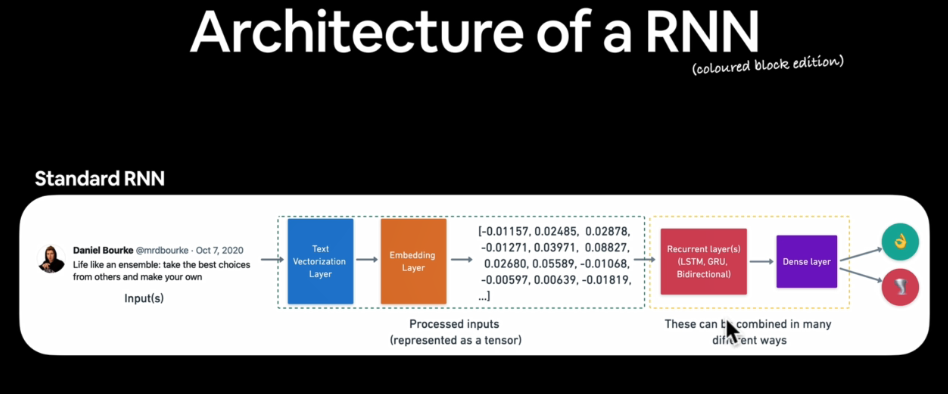

>✨**Resource:**
>* LSTM practical guide: https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM

<h1 style="color:red">lec 019:-Model 3_ Building, fitting and evaluating a GRU-cell powered RNN</h1>

### Model 3: GRU

Another popular and effective RNN component is the GRU or gated recurrent unit.

The GRU cell has similar features to an LSTM cell but has less parameters

see from here: https://towardsdatascience.com/gru-recurrent-neural-networks-a-smart-way-to-predict-sequences-in-python-80864e4fe9f6/

In [62]:
# Build an RNN using the GRU cell
from tensorflow.keras import layers
inputs = layers.Input(shape=(1,),dtype=tf.string)
x = text_vectorizer(inputs)
x = embedding(x)
x = layers.GRU(64)(x)

# x = layers.GRU(64,return_sequences=True)(x) # same as LSTM's return sequences, if you want to stack recurrent layers on top of each other, you need return_sequences = True
# x = layers.LSTM(64,return_sequences=True)(x)
# x = layers.GRU(64)(x)
# x = layers.Dense(64, activation="relu")(x)
# x = layers.GlobalAveragePooling1D()(x) # if you put return sequence = true and want to match the shape of output label use this

outputs = layers.Dense(1,activation="sigmoid")(x)
model_3 = tf.keras.Model(inputs,outputs,name="model_3_GRU")

In [63]:
model_3.summary()

Model: "model_3_GRU"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,317,313 (5.03 MB)

 Trainable params: 1,317,313 (5.03 MB)

 Non-trainable params: 0 (0.00 B)

In [64]:
# Compile the model
model_3.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

In [65]:
# Fit the model
model_3_history = model_3.fit(train_sentences,
                              train_labels,
                              epochs=5,
                              validation_data = (val_sentences,val_labels),
                              callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                                     "model_3_GRU")])

Saving TensorBoard log files to: model_logs/model_3_GRU/20260319-114736
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.9388 - loss: 0.1545 - val_accuracy: 0.7743 - val_loss: 0.7994
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.9661 - loss: 0.0911 - val_accuracy: 0.7756 - val_loss: 0.9084
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - accuracy: 0.9731 - loss: 0.0745 - val_accuracy: 0.7756 - val_loss: 0.8855
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.9746 - loss: 0.0638 - val_accuracy: 0.7743 - val_loss: 1.0319
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step - accuracy: 0.9753 - loss: 0.0583 - val_accuracy: 0.7638 - val_loss: 1.3391


In [66]:
# Make some predictions with GRU model
model_3_pred_probs = model_3.predict(val_sentences)
model_3_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


array([[1.8448698e-04],
       [5.6360888e-01],
       [9.9981868e-01],
       [7.3614069e-03],
       [1.1573415e-04],
       [9.9972981e-01],
       [9.7100717e-01],
       [9.9994731e-01],
       [9.9987900e-01],
       [9.8555148e-01]], dtype=float32)

In [67]:
# Convert model 3 pred probs to labels
model_3_preds = tf.squeeze(tf.round(model_3_pred_probs))
model_3_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 1.], dtype=float32)>

In [68]:
# Calculate model 3 results
model_3_results = calculate_results(y_true=val_labels,
                                    y_pred=model_3_preds)
model_3_results

{'accuracy': 76.37795275590551,
 'precision': 0.769789645859485,
 'recall': 0.7637795275590551,
 'f1': 0.7596002422774077}

<h1 style="color:red">lec 020:-Model 4_ Building, fitting and evaluating a bidirectional RNN model</h1>

### Model 4: Bidirectional RNN

Normal RNN's go from left to right (just like you'd read an English sentence) however, a bidirectional RNN goes from right to left as well as left to right.

In [69]:
# Build a bidirectional RNN in TensorFlow
from tensorflow.keras import layers

inputs = layers.Input(shape=(1,),dtype="string")
x= text_vectorizer(inputs)
x = embedding(x)
x = layers.Bidirectional(layers.LSTM(64))(x)

# x = layers.Bidirectional(layers.LSTM(64,return_sequences=True))(x)
# print(x.shape) # (64+64 = 128 shape) (None,15,128)
# x = layers.Bidirectional(layers.GRU(64))(x)

outputs = layers.Dense(1,activation="sigmoid")(x)

model_4 = tf.keras.Model(inputs,outputs,name="model_4_bidirectional")
#

In [70]:
model_4.summary()

Model: "model_4_bidirectional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,378,945 (5.26 MB)

 Trainable params: 1,378,945 (5.26 MB)

 Non-trainable params: 0 (0.00 B)

In [71]:
# Compile model
model_4.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

In [72]:
# Fit the model
model_4_history = model_4.fit(train_sentences,
                              train_labels,
                              epochs=5,
                              validation_data = (val_sentences,val_labels),
                              callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                                     "model_4_bidirectional")])

Saving TensorBoard log files to: model_logs/model_4_bidirectional/20260319-114903
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - accuracy: 0.9660 - loss: 0.1063 - val_accuracy: 0.7598 - val_loss: 0.9249
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.9772 - loss: 0.0547 - val_accuracy: 0.7572 - val_loss: 1.1582
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.9775 - loss: 0.0500 - val_accuracy: 0.7625 - val_loss: 1.4307
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - accuracy: 0.9787 - loss: 0.0469 - val_accuracy: 0.7638 - val_loss: 1.2879
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.9803 - loss: 0.0435 - val_accuracy: 0.7690 - val_loss: 1.4593


> **Note:** Adding bidirectionality to a model usually increases training time

In [73]:
# Make some predictions with our bidirectiona; model
model_4_pred_probs = model_4.predict(val_sentences)
model_4_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step


array([[7.78506044e-04],
       [7.98411489e-01],
       [9.99979913e-01],
       [1.11684896e-01],
       [1.42248728e-05],
       [9.95024681e-01],
       [5.29844880e-01],
       [9.99985278e-01],
       [9.99974191e-01],
       [9.02908921e-01]], dtype=float32)

In [74]:
# Convert model 3 pred probs to labels
model_4_preds = tf.squeeze(tf.round(model_4_pred_probs))
model_4_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 1.], dtype=float32)>

In [75]:
# Calculate model 4 results
model_4_results = calculate_results(y_true=val_labels,
                                    y_pred=model_4_preds)
model_4_results

{'accuracy': 76.9028871391076,
 'precision': 0.7711368167182066,
 'recall': 0.7690288713910761,
 'f1': 0.766666986890819}

In [76]:
np.array(list(model_4_results.values())) > np.array(list(baseline_results.values()))

array([False, False, False, False])

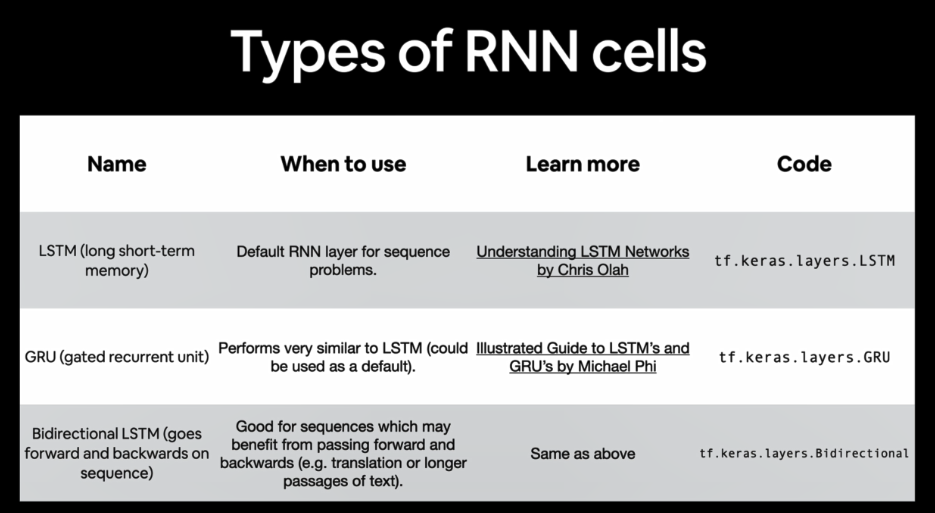

<h1 style="color:red">lec 021:-Discussing the intuition behind Conv1D neural networks for text and sequences</h1>

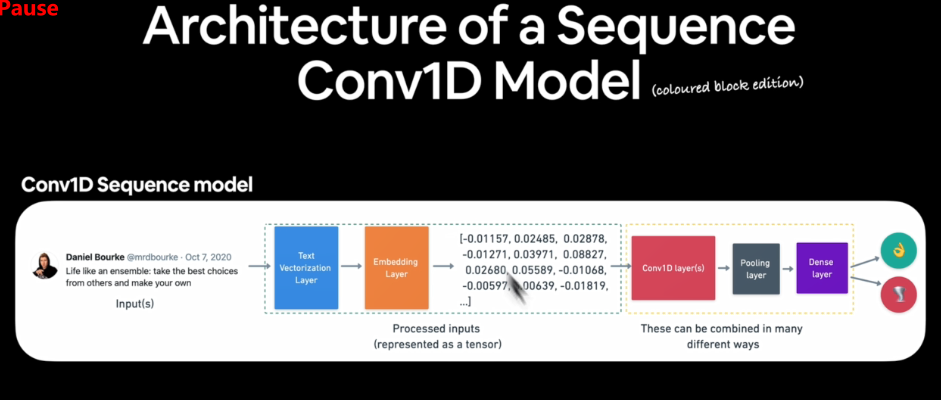

## Convolutional Neural Networks for Text (and other type of sequences)

We've used CNN's for images but images are typically 2D (height x width)... however, our text data is 1D.

Previously We've Conv2D for our image data but now we're going to use Conv1D.

The typically structure of a Conv1D model for sequences (in our case, text):

```
Inputs (text) -> Tokenization -> Embedding -> Layer(s) (typically Conv1D + pooling) -> Outputs (class probabilities)
```

### explanation of shapes of conv1d

#### hehe
Break it step by step.

---

### 1. Embedding output

```
(1, 15, 128)
```

* **1** → batch size (1 sentence)
* **15** → sequence length (padded/truncated)
* **128** → embedding dimension

So:
[
\text{each word} \rightarrow 128\text{-dim vector},\quad 15 \text{ words total}
]

---

### 2. After Conv1D

```
(1, 11, 32)
```

* filters = 32 → last dimension becomes **32**
* sequence length changes due to convolution

Using formula (`valid` padding):

[
\text{output length} = n - f + 1 = 15 - 5 + 1 = 11
]

So:

* **1** → batch
* **11** → new sequence length
* **32** → number of filters (features)

---

### 3. After GlobalMaxPool1D

```
(1, 32)
```

Global max pooling:

* takes **max over time dimension (11)**
* collapses sequence into single value per filter

So:

* from `(1, 11, 32)`
* → take max across 11
* → `(1, 32)`

---

### Intuition

* Embedding → word vectors
* Conv1D → detect patterns (like phrases)
* GlobalMaxPool → keep strongest signal per filter

---

### Summary

| Layer           | Shape        | Meaning                       |
| --------------- | ------------ | ----------------------------- |
| Embedding       | (1, 15, 128) | 15 words → 128-d vectors      |
| Conv1D          | (1, 11, 32)  | 32 features over 11 positions |
| GlobalMaxPool1D | (1, 32)      | best feature per filter       |

---

Core transformation:
[
(15 \text{ words}) \rightarrow (11 \text{ windows}) \rightarrow (32 \text{ strongest signals})
]


#### hehe
### `padding = "valid"`

* **No padding**
* Convolution only applied where filter fully fits

Output size:
[
\text{output} = \frac{n - f}{s} + 1
]

Effect:

* spatial size **shrinks**
* edge information **lost**

---

### `padding = "same"`

* Adds **zero padding** around input
* Ensures output size ≈ input size (when stride = 1)

Output size:
[
\text{output} = \left\lceil \frac{n}{s} \right\rceil
]

Effect:

* spatial size **preserved**
* edges **retained**

---

### Example (1D intuition)

Input: `[1 2 3 4 5]`, kernel size = 3

**Valid:**

```
[1 2 3] → ✔
[2 3 4] → ✔
[3 4 5] → ✔
Output size = 3
```

**Same:**

```
[0 1 2] → ✔
[1 2 3] → ✔
[2 3 4] → ✔
[3 4 5] → ✔
[4 5 0] → ✔
Output size = 5
```

---

### Practical difference

| Aspect      | valid   | same           |
| ----------- | ------- | -------------- |
| Padding     | none    | zero padding   |
| Output size | smaller | same (≈ input) |
| Edge info   | lost    | preserved      |
| Computation | less    | more           |

---

### When to use

* `valid` → when you want **strict feature extraction**
* `same` → when you want **spatial alignment (CNNs, vision tasks)**


### Model 5: Conv1d

For different explanation of parameters see:
* https://poloclub.github.io/cnn-explainer/ (this is for 2D but can relate to 1D data)
* Difference between "same" and "valid" padding: go to above cell

In [77]:
# test out our embedding layer, Conv1D layer and max pooling
embedding_test = embedding(text_vectorizer(["this is a test sentence"])) # turn target sequence into embedding
conv_1d = layers.Conv1D(filters=32,
                        kernel_size=5, # this is also referred to as ngram of 5 (meaning it looks 5 words at a time)
                        strides =1, # default
                        activation="relu",
                        padding = "same") # default = "valid" the output will be smaller than the input shape, "same" means output is same shape as input
conv_1d_output = conv_1d(embedding_test) # pass test_embedding through conv1d layer
max_pool = layers.GlobalMaxPool1D()
max_pool_output = max_pool(conv_1d_output) # equivalent to "get the most important feature" or "get the feature with the highest value"

embedding_test.shape, conv_1d_output.shape, max_pool_output.shape

(TensorShape([1, 15, 128]), TensorShape([1, 15, 32]), TensorShape([1, 32]))

>**Note:** if we change padding = valid to same the dimensions will be 1,15,32 no edge information loss
```
(TensorShape([1, 15, 128]), TensorShape([1, 11, 32]), TensorShape([1, 32]))
```
>

In [78]:
embedding_test

<tf.Tensor: shape=(1, 15, 128), dtype=float32, numpy=
array([[[ 0.01979685,  0.04679245,  0.00403137, ..., -0.01159363,
          0.03935336,  0.03594663],
        [ 0.01421497,  0.07757375,  0.02158028, ...,  0.00328337,
         -0.02726589,  0.06021616],
        [ 0.03007549,  0.04259919,  0.02068384, ..., -0.00565562,
         -0.02772705, -0.02926712],
        ...,
        [-0.01100446,  0.0253668 , -0.01394862, ...,  0.05273297,
          0.00664579,  0.015429  ],
        [-0.01100446,  0.0253668 , -0.01394862, ...,  0.05273297,
          0.00664579,  0.015429  ],
        [-0.01100446,  0.0253668 , -0.01394862, ...,  0.05273297,
          0.00664579,  0.015429  ]]], dtype=float32)>

In [79]:
conv_1d_output

<tf.Tensor: shape=(1, 15, 32), dtype=float32, numpy=
array([[[0.        , 0.01410839, 0.00477503, 0.        , 0.        ,
         0.        , 0.06313304, 0.        , 0.        , 0.        ,
         0.        , 0.01036073, 0.0733543 , 0.04522121, 0.        ,
         0.00786905, 0.        , 0.06183752, 0.        , 0.02921828,
         0.06032254, 0.03820051, 0.        , 0.04316627, 0.00033275,
         0.        , 0.        , 0.03701749, 0.02522994, 0.08483469,
         0.        , 0.        ],
        [0.01525337, 0.12734887, 0.0531867 , 0.        , 0.00932063,
         0.        , 0.12134898, 0.00671891, 0.03900065, 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.06740804, 0.        , 0.00895795, 0.0396607 ,
         0.01897405, 0.00021596, 0.        , 0.03330386, 0.09591395,
         0.01915913, 0.        ],
        [0.        , 0.        , 0.02121938, 0.0232

In [80]:
max_pool_output

<tf.Tensor: shape=(1, 32), dtype=float32, numpy=
array([[0.0644068 , 0.12734887, 0.0531867 , 0.03942458, 0.04216149,
        0.00425589, 0.12134898, 0.08623028, 0.05491474, 0.04022491,
        0.02682712, 0.04951029, 0.0733543 , 0.06137037, 0.03363373,
        0.00786905, 0.04274198, 0.10720734, 0.03139536, 0.12952308,
        0.06032254, 0.11193373, 0.05870759, 0.04316627, 0.08923639,
        0.0462606 , 0.03839522, 0.0694139 , 0.05860189, 0.09591395,
        0.01915913, 0.04420362]], dtype=float32)>

<h1 style="color:red">lec 022:-Model 5_ Building, fitting and evaluating a 1D CNN for text</h1>

In [81]:
# Create 1-dimensional convolutional layer to model sequences
from tensorflow.keras import layers

inputs = layers.Input(shape=(1,),dtype=tf.string)

x = text_vectorizer(inputs)
x = embedding(x)
x = layers.Conv1D(filters=64, kernel_size=5, strides=1,activation="relu",padding="valid")(x)
x = layers.GlobalMaxPool1D()(x)
# x = layers.Dense(64, activation="relu")(x)

outputs = layers.Dense(1,activation="sigmoid")(x)

model_5 = tf.keras.Model(inputs,outputs,name="model_5_Conv1D")


# Compile the model
model_5.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])


In [82]:
model_5.summary()

Model: "model_5_Conv1D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 15)             │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 15, 128)        │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 11, 64)         │        41,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 64)             │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,321,089 (5.04 MB)

 Trainable params: 1,321,089 (5.04 MB)

 Non-trainable params: 0 (0.00 B)

In [83]:
# Fit the model
model_5_history = model_5.fit(train_sentences,
                    train_labels,
                    epochs=5,
                    validation_data=(val_sentences, val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                           "Conv1D")])

Saving TensorBoard log files to: model_logs/Conv1D/20260319-115042
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.9610 - loss: 0.1246 - val_accuracy: 0.7782 - val_loss: 0.9111
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9734 - loss: 0.0737 - val_accuracy: 0.7572 - val_loss: 1.0477
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.9731 - loss: 0.0631 - val_accuracy: 0.7598 - val_loss: 1.1441
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9780 - loss: 0.0547 - val_accuracy: 0.7612 - val_loss: 1.1739
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.9790 - loss: 0.0507 - val_accuracy: 0.7585 - val_loss: 1.2320


In [84]:
# Make some predictions
model_5_pred_probs = model_5.predict(val_sentences)
model_5_pred_probs.shape, model_5_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


((762, 1),
 array([[3.2878634e-01],
        [8.6983287e-01],
        [9.9989617e-01],
        [6.2647343e-02],
        [3.4075447e-07],
        [9.9144173e-01],
        [9.6770334e-01],
        [9.9995583e-01],
        [9.9999952e-01],
        [9.3504900e-01]], dtype=float32))

In [85]:
# Convert model 5 pred probs to labels
model_5_preds = tf.squeeze(tf.round(model_5_pred_probs))
model_5_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 1.], dtype=float32)>

In [86]:
# Evaluate model 5 predictions
model_5_results = calculate_results(y_true=val_labels,
                                    y_pred=model_5_preds)
model_5_results

{'accuracy': 75.8530183727034,
 'precision': 0.7593999956661763,
 'recall': 0.7585301837270341,
 'f1': 0.756605147545421}

In [87]:
baseline_results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

In [88]:
np.array(list(model_5_results.values())) > np.array(list(baseline_results.values()))

array([False, False, False, False])

<h1 style="color:red">lec 023:-Using TensorFlow Hub for pretrained word embeddings (transfer learning for NLP)</h1>

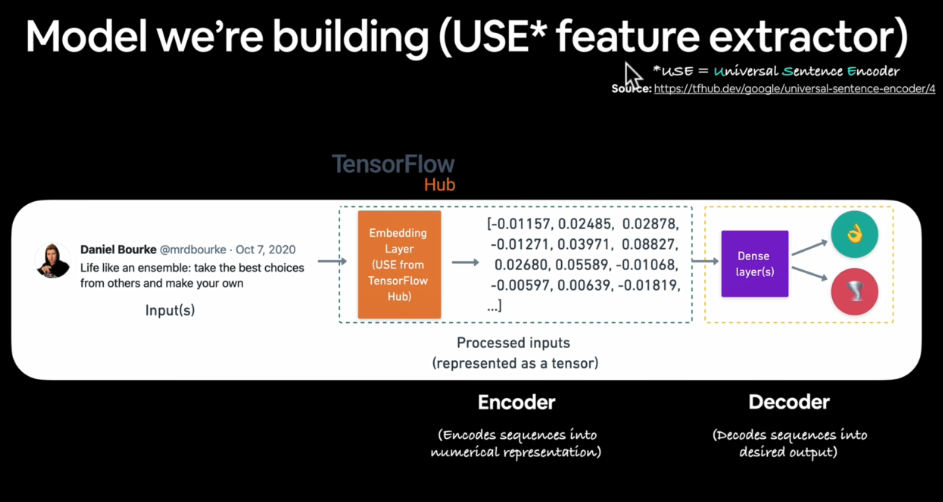

### Model 6: TensorFlow Hub Pretrained Sentence Encoder

Now we've built a few of our own models, let's try and use transfer learning for NLP, specifically using TensorFlow Hub's Universal Sentence Encoder:https://tfhub.dev/google/universal-sentence-encoder/4

See how the USE was created here: https://arxiv.org/abs/1803.11175

In [89]:
import tensorflow as tf
print(tf.__version__)

2.19.0


| Aspect      | Kaggle v2   | TF Hub v4          |
| ----------- | ----------- | ------------------ |
| Version     | Older       | Newer              |
| Stability   | Medium      | High               |
| Performance | Good        | Better             |
| Maintenance | Less active | Actively supported |


<h1 style="color:red">lec 024:-Model 6_ Building, training and evaluating a transfer learning model for NLP</h1>

In [90]:
# Create a Keras Layer using the USE pretrained layer from tensorflow hub
# sentence_encoder_layer = hub.KerasLayer("https://tfhub.dev/google/universal-sentence-encoder/4",
#                                         input_shape=[], # any variable leangth can go from this model but it always outputs 512 vector so we have to change it or do something ABOUT IT.
#                                         dtype=tf.string,
#                                         trainable=False,
#                                         name="USE")

In [91]:
# Create model using the Sequential API
# model_6 = tf.keras.Sequential([
#     sentence_encoder_layer,
#     # tf.keras.layers.Dense(64, activation="relu"),
#     tf.keras.layers.Dense(1,activation="sigmoid")
# ],name="model_6_USE")

In [92]:
import tensorflow as tf
import tensorflow_hub as hub

# sentence_encoder_layer = hub.KerasLayer(
#     "https://tfhub.dev/google/universal-sentence-encoder/4",
#     trainable=False
# )

# inputs = tf.keras.Input(shape=[], dtype=tf.string)
# x = sentence_encoder_layer(inputs)
# outputs = tf.keras.layers.Dense(1, activation="sigmoid")(x)

# model_6 = tf.keras.Model(inputs, outputs)

In [17]:
import tensorflow as tf
import tensorflow_hub as hub

@tf.keras.utils.register_keras_serializable() # for saving the uselayer in keras model too
class USELayer(tf.keras.layers.Layer):
    def __init__(self,**kwargs):
        super().__init__(**kwargs)
        self.use = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

    def call(self, inputs):
        return self.use(inputs)

inputs = tf.keras.Input(shape=[], dtype=tf.string)
x = USELayer()(inputs)
x = tf.keras.layers.Dense(64, activation="relu")(x)
outputs = tf.keras.layers.Dense(1, activation="sigmoid")(x)

model_6 = tf.keras.Model(inputs, outputs)

In [18]:
# Compile
model_6.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

model_6.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None)                 │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ use_layer (USELayer)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,897 (128.50 KB)

 Trainable params: 32,897 (128.50 KB)

 Non-trainable params: 0 (0.00 B)

In [22]:
# Train a classifier on top of USE pretrained model
model_6_history = model_6.fit(train_sentences,
                    train_labels,
                    epochs=5,
                    validation_data=(val_sentences, val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                           "tf_hub_sentence_encoder")])

Saving TensorBoard log files to: model_logs/tf_hub_sentence_encoder/20260320-123022
Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.7743 - loss: 0.5052 - val_accuracy: 0.8018 - val_loss: 0.4518
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8145 - loss: 0.4150 - val_accuracy: 0.8150 - val_loss: 0.4397
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.8232 - loss: 0.4013 - val_accuracy: 0.8136 - val_loss: 0.4342
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8259 - loss: 0.3933 - val_accuracy: 0.8163 - val_loss: 0.4305
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.8262 - loss: 0.3871 - val_accuracy: 0.8136 - val_loss: 0.4252


In [23]:
# Make predictions using USE TF Hub Model
model_6_pred_probs = model_6.predict(val_sentences)
model_6_pred_probs.shape, model_6_pred_probs[:10]
#

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step


((762, 1),
 array([[0.15569861],
        [0.7980734 ],
        [0.9880422 ],
        [0.19206879],
        [0.7432266 ],
        [0.6974868 ],
        [0.9805349 ],
        [0.97823215],
        [0.9447846 ],
        [0.08798933]], dtype=float32))

In [24]:
# Convert prediction probabilities to labels
model_6_preds = tf.squeeze(tf.round(model_6_pred_probs))
model_6_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 1., 1., 1., 1., 1., 0.], dtype=float32)>

In [32]:
# Calculate model 6 performance metrics
model_6_results = calculate_results(y_true=val_labels,
                                    y_pred=model_6_preds)
model_6_results

{'accuracy': 81.36482939632546,
 'precision': 0.8147394195152357,
 'recall': 0.8136482939632546,
 'f1': 0.8125379768469352}

In [99]:
baseline_results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

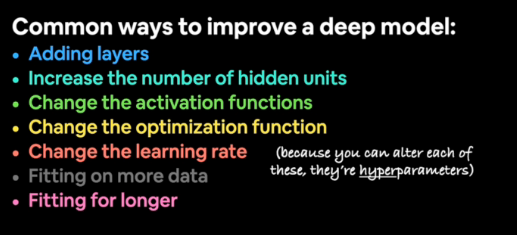

<h1 style="color:red">lec 025:-Preparing subsets of data for model 7 (same as model 6 but 10% of data)</h1>

In [100]:
len(train_sentences)

6851

In [101]:
len(train_df_shuffled)

7613

### Model 7: TF Hub Pretrained USE but with 10% of the training data

Transfer learning really helps when you don't have a large dataset.

To see how our model performs on a smaller dataset, let's replicate `model_6` except we'll train it on 10% of the data.



In [102]:
## Note: Making data splits like below leads to data leakage (model_7 trained on 10% data, outperforms model_6 trained on 100% data)
## DO NOT MAKE DATA SPLITS WHICH LEAK DATA FROM VALIDATION/TEST SETS INTO TRAINING SET


# # Create subsets of 10% of the training data
# train_10_percent = train_df_shuffled[["text","target"]].sample(frac=0.1,random_state=42)
# train_sentences_10_percent = train_10_percent["text"].to_list()
# train_labels_10_percent = train_10_percent["target"].to_list()
# len(train_sentences_10_percent), len(train_labels_10_percent)

> 🔑**Note:** Be *very* careful when creating training/val/test splits that you don't leak data accross the datasets, otherwise your model evaluation metrics will be wrong. If something looks too good to be true (a model trained on 10% of data outperforming the same model trained on 100% of data) trust your gut and go back to find where error may lie.



In [115]:
# Making a better dataset split (no data leakage)
train_10_percent_split = int(0.1*len(train_sentences))
train_sentences_10_percent = train_sentences[:train_10_percent_split] # these are already shuffled because we made train_sentences on train_df_shuffled
train_labels_10_percent = train_labels[:train_10_percent_split]

In [121]:
train_sentences_10_percent[:10]

array(['@mogacola @zamtriossu i screamed after hitting tweet',
       'Imagine getting flattened by Kurt Zouma',
       '@Gurmeetramrahim #MSGDoing111WelfareWorks Green S welfare force ke appx 65000 members har time disaster victim ki help ke liye tyar hai....',
       "@shakjn @C7 @Magnums im shaking in fear he's gonna hack the planet",
       'Somehow find you and I collide http://t.co/Ee8RpOahPk',
       '@EvaHanderek @MarleyKnysh great times until the bus driver held us hostage in the mall parking lot lmfao',
       'destroy the free fandom honestly',
       'Weapons stolen from National Guard Armory in New Albany still missing #Gunsense http://t.co/lKNU8902JE',
       '@wfaaweather Pete when will the heat wave pass? Is it really going to be mid month? Frisco Boy Scouts have a canoe trip in Okla.',
       'Patient-reported outcomes in long-term survivors of metastatic colorectal cancer - British Journal of Surgery http://t.co/5Yl4DC1Tqt'],
      dtype=object)

In [122]:
type(train_sentences_10_percent)

numpy.ndarray

In [119]:
train_labels_10_percent[:10]

array([0, 0, 1, 0, 0, 1, 1, 0, 1, 1])

In [120]:
type(train_labels_10_percent)

numpy.ndarray

In [116]:
# Check the number of each label in the updated training data subset
pd.Series(np.array(train_labels_10_percent)).value_counts()

,count
0,406
1,279


> well similar to our previous 0,1 ratios yes it's representative of our whole dataset so no problem

<h1 style="color:red">lec 026:-Model 7_ Building, training and evaluating a transfer learning model on 10% data</h1>

To recreate a model the same model as a previous model you've created you can use the `tf.keras.models.clone_model()` method, see more: https://www.tensorflow.org/api_docs/python/tf/keras/models/clone_model

In [123]:
# Let's build a model the same as model_6
model_7 = tf.keras.models.clone_model(model_6)

# Compile model
model_7.compile(loss="binary_crossentropy",
                optimizer = tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Get a summary (will be same as model_6)
model_7.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ keras_tensor_26 (InputLayer)    │ (None)                 │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ use_layer (USELayer)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,897 (128.50 KB)

 Trainable params: 32,897 (128.50 KB)

 Non-trainable params: 0 (0.00 B)

>**Note:** In model 6 uselayer class you must provide **kwargs parameter for other tf works like cloning etc in superinit also in init

In [106]:
# print(train_sentences_10_percent.dtype)

AttributeError: 'list' object has no attribute 'dtype'

In [124]:
train_sentences_10_percent = tf.constant(train_sentences_10_percent)
val_sentences = tf.constant(val_sentences)

In [125]:
train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_sentences_10_percent, train_labels_10_percent)
).batch(32)

val_dataset = tf.data.Dataset.from_tensor_slices(
    (val_sentences, val_labels)
).batch(32)

model_7.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=5,
    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                          "tf_hub_sentence_encoder_10_percent_correct_split")]
)

Saving TensorBoard log files to: model_logs/tf_hub_sentence_encoder_10_percent/20260319-120858
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.7066 - loss: 0.6664 - val_accuracy: 0.7336 - val_loss: 0.6476
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.8073 - loss: 0.5959 - val_accuracy: 0.7690 - val_loss: 0.5892
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.8248 - loss: 0.5186 - val_accuracy: 0.7743 - val_loss: 0.5352
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.8321 - loss: 0.4564 - val_accuracy: 0.7769 - val_loss: 0.5034
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.8380 - loss: 0.4148 - val_accuracy: 0.7782 - val_loss: 0.4897


In [126]:
# Make predictions with the model trained on 10% of the data
model_7_pred_probs=model_7.predict(val_sentences)

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


In [127]:
model_7_pred_probs[:10]

array([[0.21788235],
       [0.60971826],
       [0.9168335 ],
       [0.32986823],
       [0.51341945],
       [0.6790037 ],
       [0.9012616 ],
       [0.80146706],
       [0.83167344],
       [0.18047017]], dtype=float32)

In [128]:
# Turn pred probs into labels
model_7_preds = tf.squeeze(tf.round(model_7_pred_probs))
model_7_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 1., 1., 1., 1., 1., 0.], dtype=float32)>

In [129]:
# Evaluate model 7 predictions
model_7_results = calculate_results(y_true=val_labels,
                                    y_pred=model_7_preds)
model_7_results

{'accuracy': 77.82152230971128,
 'precision': 0.7790000273393579,
 'recall': 0.7782152230971129,
 'f1': 0.776732468906972}

In [130]:
model_6_results

{'accuracy': 81.75853018372703,
 'precision': 0.8190970972170162,
 'recall': 0.8175853018372703,
 'f1': 0.816365758450113}

>**Note:** Wow!! model_7 metrics are higher than model_6 which trained on full data while our model 7 just trained on only 10 percent data and model_7 and model_6 are same 😭😭😭😭😭😭

Hehe we successfully solved the data leakage problem

>there is a data leakage problem because we made train and val split from train_df_shuffled and we then create our train_df_10_percent on this same train_df_shuffled now becuase of this there is some part of data of val sentences in our train_df_10_percent because we didn't split it propery into train and val sets and now because of this model is predicting on the data which it seen before so obviously it's going to perform better.

<h1 style="color:red">lec 028:-Comparing all our modelling experiments evaluation metrics</h1>

## Compare the performance of each of our models

In [131]:
# Combine model results into a DataFrame
all_model_results = pd.DataFrame({"0_baseline":baseline_results,
                                  "1_simple_dense":model_1_results,
                                  "2_lstm":model_2_results,
                                  "3_gru":model_3_results,
                                  "4_bidirectional":model_4_results,
                                  "5_conv1d":model_5_results,
                                  "6_tf_hub_use_encoder":model_6_results,
                                  "7_tf_hub_use_encoder_10_percent":model_7_results})
all_model_results.transpose()

,accuracy,precision,recall,f1
0_baseline,79.265092,0.811139,0.792651,0.786219
1_simple_dense,79.265092,0.800288,0.792651,0.788982
2_lstm,77.952756,0.794930,0.779528,0.773129
3_gru,76.377953,0.769790,0.763780,0.759600
4_bidirectional,76.902887,0.771137,0.769029,0.766667
5_conv1d,75.853018,0.759400,0.758530,0.756605
6_tf_hub_use_encoder,81.758530,0.819097,0.817585,0.816366
7_tf_hub_use_encoder_10_percent,77.821522,0.779000,0.778215,0.776732


In [132]:
## This will not work first save transpose and then apply vectorize method on it

# Reduce the accuracy to the same scale as other meetrics
# all_model_results.transpose()["accuracy"] = all_model_results.transpose()["accuracy"]/100
# all_model_results.transpose()

,accuracy,precision,recall,f1
0_baseline,79.265092,0.811139,0.792651,0.786219
1_simple_dense,79.265092,0.800288,0.792651,0.788982
2_lstm,77.952756,0.794930,0.779528,0.773129
3_gru,76.377953,0.769790,0.763780,0.759600
4_bidirectional,76.902887,0.771137,0.769029,0.766667
5_conv1d,75.853018,0.759400,0.758530,0.756605
6_tf_hub_use_encoder,81.758530,0.819097,0.817585,0.816366
7_tf_hub_use_encoder_10_percent,77.821522,0.779000,0.778215,0.776732


In [133]:
all_model_results = all_model_results.transpose()
all_model_results["accuracy"] = all_model_results["accuracy"]/100
all_model_results

,accuracy,precision,recall,f1
0_baseline,0.792651,0.811139,0.792651,0.786219
1_simple_dense,0.792651,0.800288,0.792651,0.788982
2_lstm,0.779528,0.794930,0.779528,0.773129
3_gru,0.763780,0.769790,0.763780,0.759600
4_bidirectional,0.769029,0.771137,0.769029,0.766667
5_conv1d,0.758530,0.759400,0.758530,0.756605
6_tf_hub_use_encoder,0.817585,0.819097,0.817585,0.816366
7_tf_hub_use_encoder_10_percent,0.778215,0.779000,0.778215,0.776732


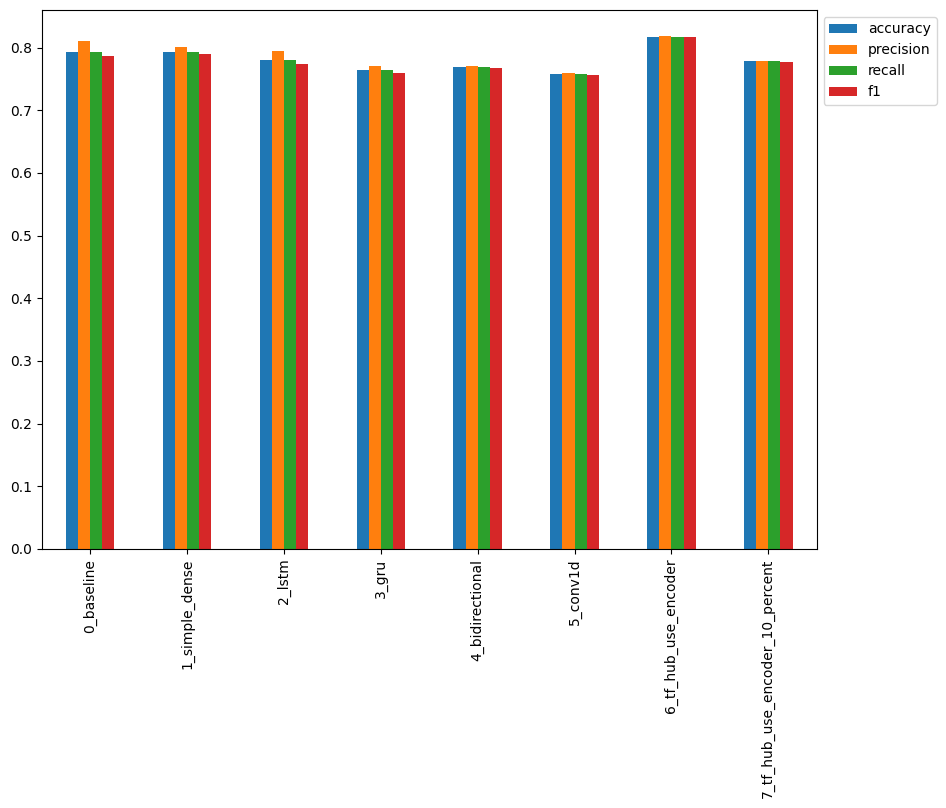

In [134]:
# Plot and compare all of the model results
all_model_results.plot(kind="bar",figsize=(10,7)).legend(bbox_to_anchor=(1.0,1.0));
#

<Axes: >

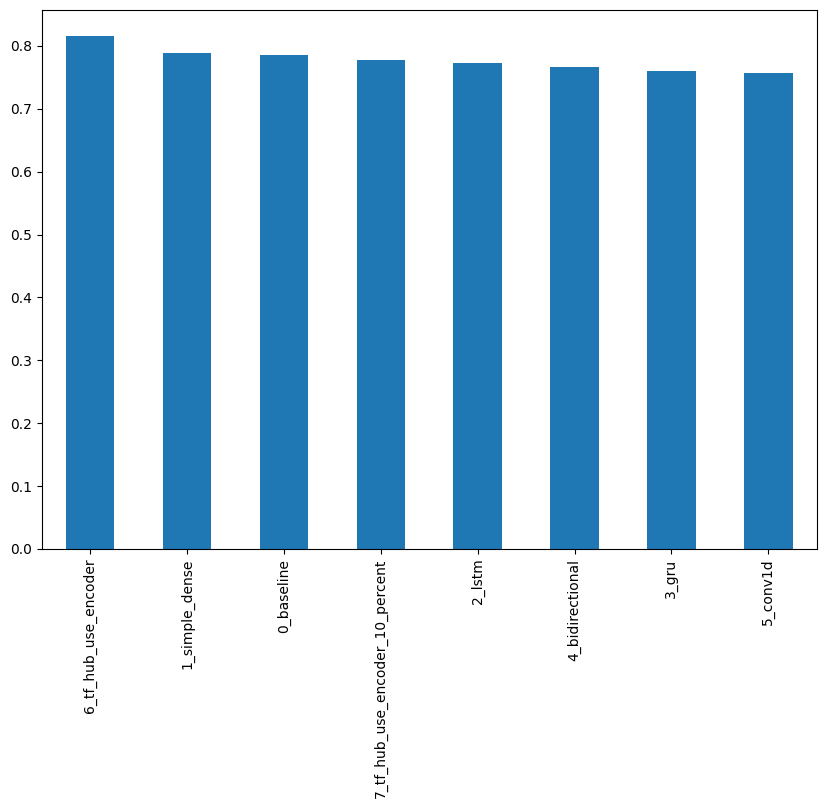

In [135]:
# Sort model results by f1-score
all_model_results.sort_values("f1",ascending=False)["f1"].plot(kind="bar",figsize=(10,7))

In [138]:
%load_ext tensorboard

In [139]:
%tensorboard --logdir /content/model_logs

Output hidden; open in https://colab.research.google.com to view.

>📖**Resources:** TensorBoard is great for quickly tracking experiments but for larger scale experiments and a whole bunch more tracking options, check out Weights & Biases: https://wandb.ai/site

<h1 style="color:red">lec 030:-Saving and loading in a trained NLP model with TensorFlow</h1>

In [ ]:
## Saving and loading a trained model

There are two main formats to save a model to in TensorFlow:
1. The

In [140]:
# model_6.save("model_dir", save_format="tf") # going to give the error it is removed

ValueError: The `save_format` argument is deprecated in Keras 3. Please remove this argument and pass a file path with either `.keras` or `.h5` extension.Received: save_format=tf

Your error is correct. The earlier approach is **outdated for Keras 3**.

---

### What changed in Keras 3

This is now **invalid**:

```python
model.save("model_dir", save_format="tf")  # ❌ deprecated
```

Keras 3 removed `save_format`.

---

### Correct way now

#### 1. Keras format (recommended)

```python
model.save("model.keras")
```

---

#### 2. HDF5 (legacy)

```python
model.save("model.h5")
```

---

#### 3. TensorFlow SavedModel (NEW way)

Use **export**, not save:

```python
model.export("model_dir")
```

---

### Why this change

Keras 3 split responsibilities:

* `model.save()` → Keras formats only (`.keras`, `.h5`)
* `model.export()` → TensorFlow SavedModel (for deployment)

---

### Your case

Since you used:

```python
hub.load(...)  # TF Hub model inside
```

You should use:

```python
model_6.export("model_dir")
```

---

### Core

* `save_format` → removed
* `.keras` → standard saving
* `export()` → replacement for SavedModel

---

### Bottom line

Your error isn’t random — it’s due to **version shift (Keras 2 → Keras 3)**.


No.

---

### `model.export()` output

```python
model.export("model_dir")
```

Produces a **TensorFlow SavedModel for inference only**.

---

### What you lose

After export:

* ❌ no training
* ❌ no optimizer state
* ❌ no gradients
* ❌ no `compile()` / `fit()`

---

### Why

Exported model is:

```text
frozen computation graph
```

Not a Keras model anymore.

---

### What you can do with it

* ✅ inference (`predict`)
* ✅ deployment (TF Serving, TFLite)
* ✅ load via:

```python
tf.saved_model.load("model_dir")
```

---

### If you want to train later

You must save using:

```python
model.save("model.keras")
```

This preserves:

* architecture
* weights
* training config

---

### Summary

| Method     | Train later? |
| ---------- | ------------ |
| `.keras`   | ✅ yes        |
| `.h5`      | ✅ yes        |
| `export()` | ❌ no         |

---

### Core

`export()` = deployment artifact
Not a trainable model anymore


In [147]:
model_6.save("model_6_sentence_encoder.keras")

In [148]:
keras_loaded_model = tf.keras.models.load_model("model_6_sentence_encoder.keras")

In [149]:
keras_loaded_model_pred_probs = keras_loaded_model.predict(val_sentences)
keras_loaded_model_pred_probs[:10]

24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step


array([[0.16091132],
       [0.71376413],
       [0.9883118 ],
       [0.2531135 ],
       [0.68450683],
       [0.65608186],
       [0.9803786 ],
       [0.97912073],
       [0.9280161 ],
       [0.11882847]], dtype=float32)

In [150]:
keras_loaded_model_preds = tf.squeeze(tf.round(keras_loaded_model_pred_probs))

In [151]:
keras_loaded_model_results = calculate_results(y_true=val_labels,
                                             y_pred=keras_loaded_model_preds)
keras_loaded_model_results # it's similar to our model_6

{'accuracy': 81.10236220472441,
 'precision': 0.8133775926251001,
 'recall': 0.8110236220472441,
 'f1': 0.8094148711514625}

### another way to load our model is using custom_objects argument with using `@tf.keras.utils.register_keras_serializable()` decorator on top of our uselayer class

In [ ]:
# keras_loaded_model = tf.keras.models.load_model(
#     "model_6_sentence_encoder.keras",
#     custom_objects={"USELayer": USELayer}
# )

Yes.

---

### `model.export()` does NOT need

```python
@tf.keras.utils.register_keras_serializable
```

---

### Why

`export()`:

* does **not serialize Python classes**
* saves a **pure TensorFlow graph (SavedModel)**

So:

```text
No class reconstruction → no need for registration
```

---

### Contrast

#### `.save()` (Keras format)

```text
Needs:
- class name
- config
- reconstruction
→ requires registration or custom_objects
```

---

#### `.export()` (SavedModel)

```text
Saves:
- computation graph
- weights
→ no Python class needed
```

---

### Result

You can load exported model like:

```python
loaded = tf.saved_model.load("model_dir")
```

No mention of `USELayer` anywhere.

---

### Limitation

After export:

* ❌ cannot train
* ❌ cannot recover original Keras model
* ❌ no custom layer reconstruction

---

### Core

* `.save()` → needs class → needs registration
* `.export()` → graph only → no registration needed


In [152]:
model_6.export("model_6_sentence_encoder_saved_model")

Saved artifact at 'model_6_sentence_encoder_saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None,), dtype=tf.string, name='keras_tensor_36')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  136940687790288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687790096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687789904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687789712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687789520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687789328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687789136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687788944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687788752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136940687788560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1369

In [153]:
exported_model = tf.saved_model.load("model_6_sentence_encoder_saved_model")

In [154]:
# exported_model_pred_probs = exported_model.predict(val_sentences)
# exported_model_pred_probs[:10]

AttributeError: '_UserObject' object has no attribute 'predict'

Expected behavior.

---

### What you loaded

```python
exported_model = tf.saved_model.load("model_dir")
```

This returns:

```text
_UserObject
```

Not a Keras model → so:

```python
exported_model.predict(...)  # ❌ doesn't exist
```

---

### How to use exported model

SavedModel exposes **signatures**, not `.predict()`.

---

### Step 1: check available signatures

```python
print(exported_model.signatures)
```

You’ll usually see:

```text
'serving_default'
```

---

### Step 2: call it

```python
infer = exported_model.signatures["serving_default"]

preds = infer(val_sentences)
```

---

### Important

If input is string:

```python
preds = infer(tf.constant(val_sentences))
```

---

### Output format

You’ll get a dict:

```python
preds.keys()
```

Example:

```text
{'output_0': ...}
```

Access it:

```python
pred_probs = preds["output_0"]
```

---

### Why this happens

* `.export()` → TensorFlow graph
* graph exposes **functions (signatures)**
* no Keras wrapper → no `.predict()`

---

### Core

* `_UserObject` ≠ Keras model
* use `.signatures["serving_default"]`
* outputs come as dict, not array


In [155]:
print(exported_model.signatures)

_SignatureMap({'serve': <ConcreteFunction (*, keras_tensor_36: TensorSpec(shape=(None,), dtype=tf.string, name='keras_tensor_36')) -> Dict[['output_0', TensorSpec(shape=(None, 1), dtype=tf.float32, name='output_0')]] at 0x7C8C80A48F80>, 'serving_default': <ConcreteFunction (*, keras_tensor_36: TensorSpec(shape=(None,), dtype=tf.string, name='keras_tensor_36')) -> Dict[['output_0', TensorSpec(shape=(None, 1), dtype=tf.float32, name='output_0')]] at 0x7C8C805A67E0>})


Good. You have two signatures:

```text
'serve'
'serving_default'
```

Both are equivalent here.

---

### Use it correctly

```python
infer = exported_model.signatures["serving_default"]

preds = infer(tf.constant(val_sentences))
```

---

### Extract output

Your output key is:

```text
'output_0'
```

So:

```python
pred_probs = preds["output_0"]
```

---

### Convert to labels

```python
pred_labels = tf.round(pred_probs)
```

---

### Full flow

```python
infer = exported_model.signatures["serving_default"]

preds = infer(tf.constant(val_sentences))

pred_probs = preds["output_0"]
pred_labels = tf.round(pred_probs)
```

---

### Why this works

From your signature:

```text
TensorSpec(shape=(None,), dtype=tf.string)
→ output: (None, 1)
```

So input must be:

```python
tf.constant([...], dtype=tf.string)
```

---

### Core

* call signature, not `.predict()`
* pass tensor input
* output is dict → extract `'output_0'`


In [156]:
infer = exported_model.signatures["serving_default"]

preds = infer(tf.constant(val_sentences))

pred_probs=preds["output_0"]
pred_probs[:10]

<tf.Tensor: shape=(10, 1), dtype=float32, numpy=
array([[0.16091132],
       [0.71376413],
       [0.9883118 ],
       [0.2531135 ],
       [0.68450683],
       [0.65608186],
       [0.9803786 ],
       [0.97912073],
       [0.9280161 ],
       [0.11882847]], dtype=float32)>

In [157]:
pred_labels = tf.squeeze(tf.round(pred_probs))
pred_labels[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 1., 1., 1., 1., 1., 0.], dtype=float32)>

In [158]:
exported_model_results = calculate_results(y_true=val_labels,
                                             y_pred=pred_labels)
exported_model_results

{'accuracy': 81.10236220472441,
 'precision': 0.8133775926251001,
 'recall': 0.8110236220472441,
 'f1': 0.8094148711514625}

In [162]:
np.isclose(keras_loaded_model_results["f1"], exported_model_results["f1"],atol=0.0001)

np.True_

In [166]:
is_close_dict = {k:np.isclose(exported_model_results[k],keras_loaded_model_results.get(k,0)) for k in exported_model_results.keys()}
is_close_dict

{'accuracy': np.True_,
 'precision': np.True_,
 'recall': np.True_,
 'f1': np.True_}

In [ ]:
from google.colab import files
files.download("/content/model_6_sentence_encoder_saved_model")


<h1 style="color:red">lec 031:-Downloading a pretrained model and preparing data to investigate predictions</h1>

### Finding the most wrong examples

* If our best model still isn't perfect, what examples is it getting wrong?
* And of these wrong examples which ones is it getting *most* wrong (those will prediction probabilities closest to the opposite class)

For example if a sample should have a label of 0 but our model predicts a prediction probability of 0.999 (really close to 1) and vice versa.

In [33]:
model_6_results

{'accuracy': 81.36482939632546,
 'precision': 0.8147394195152357,
 'recall': 0.8136482939632546,
 'f1': 0.8125379768469352}

In [29]:
model_6_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 1., 1., 1., 1., 1., 0.], dtype=float32)>

In [26]:
# Create DataFrame with validation sentences, validation labels and best performing model predcitions labels
model_6_val_df = pd.DataFrame({"text": val_sentences,
                               "target": val_labels,
                               "pred": model_6_preds,
                               "pred_prob": tf.squeeze(model_6_pred_probs)})
model_6_val_df.head()


,text,target,pred,pred_prob
0,DFR EP016 Monthly Meltdown - On Dnbheaven 2015...,0,0.0,0.155699
1,FedEx no longer to transport bioterror germs i...,0,1.0,0.798073
2,Gunmen kill four in El Salvador bus attack: Su...,1,1.0,0.988042
3,@camilacabello97 Internally and externally scr...,1,0.0,0.192069
4,Radiation emergency #preparedness starts with ...,1,1.0,0.743227


In [27]:
# Find the wrong predictions and sort by prediction proobabilities
most_wrong = model_6_val_df[model_6_val_df["target"] != model_6_val_df["pred"]].sort_values("pred_prob",ascending=False)
most_wrong[:10] # these are called false positives

,text,target,pred,pred_prob
31,? High Skies - Burning Buildings ? http://t.co...,0,1.0,0.906535
759,FedEx will no longer transport bioterror patho...,0,1.0,0.900523
628,@noah_anyname That's where the concentration c...,0,1.0,0.868134
49,@madonnamking RSPCA site multiple 7 story high...,0,1.0,0.850081
393,@SonofLiberty357 all illuminated by the bright...,0,1.0,0.845947
251,@AshGhebranious civil rights continued in the ...,0,1.0,0.837901
209,Ashes 2015: AustraliaÛªs collapse at Trent Br...,0,1.0,0.828947
109,[55436] 1950 LIONEL TRAINS SMOKE LOCOMOTIVES W...,0,1.0,0.824109
1,FedEx no longer to transport bioterror germs i...,0,1.0,0.798073
567,@RebeccaforReal accepts Wisconsin Emergency Re...,0,1.0,0.797263


In [28]:
most_wrong.tail() # these are called false negatives

,text,target,pred,pred_prob
233,I get to smoke my shit in peace,1,0.0,0.045049
411,@SoonerMagic_ I mean I'm a fan but I don't nee...,1,0.0,0.040390
38,Why are you deluged with low self-image? Take ...,1,0.0,0.039744
244,Reddit Will Now QuarantineÛ_ http://t.co/pkUA...,1,0.0,0.035897
23,Ron &amp; Fez - Dave's High School Crush https...,1,0.0,0.031566


Let's remind ourselves of the target labels...
* `0` = not disaster
* `1` = disaster

<h1 style="color:red">lec 032:-Visualising our model's most wrong predictions</h1>

In [35]:
# Check the false positives (model predicted 1 when should've been 0)
for row in most_wrong[:10].itertuples():
  _, text, target, pred, pred_prob = row
  print(f"Target: {target}, Pred: {pred}, Prob: {pred_prob}")
  print(f"Text:\n{text}\n")
  print("----\n")

Target: 0, Pred: 1.0, Prob: 0.9065353274345398
Text:
? High Skies - Burning Buildings ? http://t.co/uVq41i3Kx2 #nowplaying

----

Target: 0, Pred: 1.0, Prob: 0.9005228281021118
Text:
FedEx will no longer transport bioterror pathogens in wake of anthrax lab mishaps http://t.co/lHpgxc4b8J

----

Target: 0, Pred: 1.0, Prob: 0.8681342005729675
Text:
@noah_anyname That's where the concentration camps and mass murder come in. 
 
EVERY. FUCKING. TIME.

----

Target: 0, Pred: 1.0, Prob: 0.8500813841819763
Text:
@madonnamking RSPCA site multiple 7 story high rise buildings next to low density character residential in an area that floods

----

Target: 0, Pred: 1.0, Prob: 0.8459474444389343
Text:
@SonofLiberty357 all illuminated by the brightly burning buildings all around the town!

----

Target: 0, Pred: 1.0, Prob: 0.8379010558128357
Text:
@AshGhebranious civil rights continued in the 60s. And what about trans-generational trauma? if anything we should listen to the Americans.

----

Target: 0

In [36]:
# Check the false negatives (model predicted 0 when should've been 1)
for row in most_wrong[-10:].itertuples():
  _, text, target, pred, pred_prob = row
  print(f"Target: {target}, Pred: {pred}, Prob: {pred_prob}")
  print(f"Text:\n{text}\n")
  print("----\n")

Target: 1, Pred: 0.0, Prob: 0.06275425106287003
Text:
@DavidVonderhaar At least you were sincere ??

----

Target: 1, Pred: 0.0, Prob: 0.06129977107048035
Text:
'The way you move is like a full on rainstorm and I'm a house of cards'

----

Target: 1, Pred: 0.0, Prob: 0.059493254870176315
Text:
You can never escape me. Bullets don't harm me. Nothing harms me. But I know pain. I know pain. Sometimes I share it. With someone like you.

----

Target: 1, Pred: 0.0, Prob: 0.058031123131513596
Text:
going to redo my nails and watch behind the scenes of desolation of smaug ayyy

----

Target: 1, Pred: 0.0, Prob: 0.05266395956277847
Text:
@willienelson We need help! Horses will die!Please RT &amp; sign petition!Take a stand &amp; be a voice for them! #gilbert23 https://t.co/e8dl1lNCVu

----

Target: 1, Pred: 0.0, Prob: 0.04504890367388725
Text:
I get to smoke my shit in peace

----

Target: 1, Pred: 0.0, Prob: 0.040389757603406906
Text:
@SoonerMagic_ I mean I'm a fan but I don't need a girl sou

In [37]:
test_df

,id,keyword,location,text
0,0,NaN,NaN,Just happened a terrible car crash
1,2,NaN,NaN,"Heard about #earthquake is different cities, s..."
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan
...,...,...,...,...
3258,10861,NaN,NaN,EARTHQUAKE SAFETY LOS ANGELES ÛÒ SAFETY FASTE...
3259,10865,NaN,NaN,Storm in RI worse than last hurricane. My city...
3260,10868,NaN,NaN,Green Line derailment in Chicago http://t.co/U...
3261,10874,NaN,NaN,MEG issues Hazardous Weather Outlook (HWO) htt...


## Making predictions on the test dataset and visualizing them

In [38]:
test_sentences = tf.constant(test_df["text"])

In [39]:
model_6_test_preds = model_6.predict(test_sentences)

102/102 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step


In [40]:
model_6_test_preds[:10]

array([[0.60842496],
       [0.8731047 ],
       [0.854395  ],
       [0.9292748 ],
       [0.96315426],
       [0.55403787],
       [0.06183599],
       [0.04391904],
       [0.05146058],
       [0.0637593 ]], dtype=float32)

In [42]:
model_6_test_labels = tf.squeeze(tf.round(model_6_test_preds))
model_6_test_labels[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 0., 0., 0., 0.], dtype=float32)>

In [43]:
test_df["predicted_labels"] = model_6_test_labels.numpy()
test_df.head()

,id,keyword,location,text,predicted_labels
0,0,NaN,NaN,Just happened a terrible car crash,1.0
1,2,NaN,NaN,"Heard about #earthquake is different cities, s...",1.0
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are...",1.0
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires,1.0
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan,1.0


In [44]:
test_df["predicted_preds"] = tf.squeeze(model_6_test_preds).numpy()
test_df.head()

,id,keyword,location,text,predicted_labels,predicted_preds
0,0,NaN,NaN,Just happened a terrible car crash,1.0,0.608425
1,2,NaN,NaN,"Heard about #earthquake is different cities, s...",1.0,0.873105
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are...",1.0,0.854395
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires,1.0,0.929275
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan,1.0,0.963154


## Now what if dataset is large then you have to make predictions in chunks like below:-

In [50]:
# Making predictions on the test dataset and visualizing them
test_samples = random.sample(list(test_sentences),10)
print(test_samples)

[<tf.Tensor: shape=(), dtype=string, numpy=b'@RoxYunkFalls August 4 1915 http://t.co/jjNS0YjaLA Violent storm strikes city Manayunk flooding and damage. Sports &amp; War news'>, <tf.Tensor: shape=(), dtype=string, numpy=b"Georgian wines have become a casualty in Russia's political campaign against the Ukraine: http://t.co/wCo724AmPl">, <tf.Tensor: shape=(), dtype=string, numpy=b'@astolfialessio Reddit Will Now Quarantine Offensive Content http://t.co/XQkcD0qV3c'>, <tf.Tensor: shape=(), dtype=string, numpy=b'@ComplexMag he asking for a body bags @PUSHA_T'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Permutable site conspiracy up-to-the-minute upheaval: QWkD'>, <tf.Tensor: shape=(), dtype=string, numpy=b"The Guardian Greece's tax revenues collapse as debt crisis continues The Guardian Fresh\xc2\x89\xc3\x9b_ http://t.co/L0ARQL2q2O">, <tf.Tensor: shape=(), dtype=string, numpy=b'RT #Target Best price on #Avril Crushed Sheer #CurtainPanel #Curtains #Decor #Blinds #Shades : http://t.co/TBhbu

In [51]:
test_samples = [x.numpy().decode() for x in test_samples]
test_samples

['@RoxYunkFalls August 4 1915 http://t.co/jjNS0YjaLA Violent storm strikes city Manayunk flooding and damage. Sports &amp; War news',
 "Georgian wines have become a casualty in Russia's political campaign against the Ukraine: http://t.co/wCo724AmPl",
 '@astolfialessio Reddit Will Now Quarantine Offensive Content http://t.co/XQkcD0qV3c',
 '@ComplexMag he asking for a body bags @PUSHA_T',
 'Permutable site conspiracy up-to-the-minute upheaval: QWkD',
 "The Guardian Greece's tax revenues collapse as debt crisis continues The Guardian Fresh\x89Û_ http://t.co/L0ARQL2q2O",
 'RT #Target Best price on #Avril Crushed Sheer #CurtainPanel #Curtains #Decor #Blinds #Shades : http://t.co/TBhbuX6dc0',
 'First Stearns grenade thought to be WWII-era. This one apparently newer. Bomb squad plans to detonate around 8 p.m. http://t.co/qppTQ6oTat',
 'Shot 12 times. Found dead in cuffs after being involved in a car accident. Officers told ambulance not to treat him. https://t.co/MEUDJwaaNg',
 "@AParra210 So 

In [54]:
for test_sample in test_samples:
  pred_prob = tf.squeeze(model_6.predict(tf.constant([test_sample]))) # wrapping test_sample in [] is necessary because our model is expecting batch
  print(pred_prob)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
tf.Tensor(0.97493356, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
tf.Tensor(0.9552218, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
tf.Tensor(0.05677556, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
tf.Tensor(0.08670009, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
tf.Tensor(0.26470676, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
tf.Tensor(0.35213682, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
tf.Tensor(0.091179654, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
tf.Tensor(0.8672783, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
tf.Tensor(0.91299766, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
tf.Tensor(0.3639998, shape=(), dtype=float32)


In [55]:
# for direct predictions shuffle instead of random
indices = tf.random.shuffle(tf.range(len(test_sentences)))[:10]
test_samples = tf.gather(test_sentences, indices)

pred = model_6.predict(test_samples)
print(pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
[[0.03030006]
 [0.06532702]
 [0.06482524]
 [0.20303792]
 [0.02510349]
 [0.9036905 ]
 [0.5861358 ]
 [0.15395777]
 [0.17041023]
 [0.37647367]]


## Your challenge... predicting on Tweets from the wild

Go to your favourite Twitter account and copy one of their latest Tweets.

Then pass the Tweet through our trained model.

Is that Tweet a disaster or not disaster (according to the model)? Is the model right or wrong?

In [57]:
s = '@RoxYunkFalls August 4 1915 http://t.co/jjNS0YjaLA Violent storm strikes city Manayunk flooding and damage. Sports &amp; War news'

model_6.predict(tf.constant([s]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


array([[0.97493356]], dtype=float32)

<h1 style="color:red">lec 034:-Understanding the concept of the speed_score tradeoff</h1>

## The speed/score tradeoff

In [63]:
model_6_results # it's slow

{'accuracy': 81.36482939632546,
 'precision': 0.8147394195152357,
 'recall': 0.8136482939632546,
 'f1': 0.8125379768469352}

In [64]:
baseline_results # it's very fast and only a lil bit behind the our model_6 results

{'accuracy': 79.26509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1': 0.7862189758049549}

In [68]:
# Let's make a function to measure the time of prediction
import time
def pred_timer(model, samples):
  """
  Times how long a model takes to make predictions on a samples.
  """
  start_time = time.perf_counter() # get starts time
  model.predict(samples) # make predictions
  end_time = time.perf_counter() # get end time
  total_time = end_time - start_time # calculate how long predictions took to make
  time_per_pred = total_time/len(samples)
  return total_time, time_per_pred

In [65]:
type(val_sentences)

numpy.ndarray

In [69]:
# Calculate TF Hub Sentence Encoder time per pred
model_6_total_pred_time, model_6_time_per_pred = pred_timer(model=model_6,
                                                            samples=val_sentences)
model_6_total_pred_time, model_6_time_per_pred

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


(1.9161816659998294, 0.002514674102361981)

In [70]:
# Calculate our baseline model times per pred
baseline_total_pred_time, baseline_time_per_pred = pred_timer(model=model_0,
                                                            samples=val_sentences)
baseline_total_pred_time, baseline_time_per_pred

(0.058715037999718334, 7.705385564267498e-05)

Text(0.5, 0, 'Time per prediction (s)')

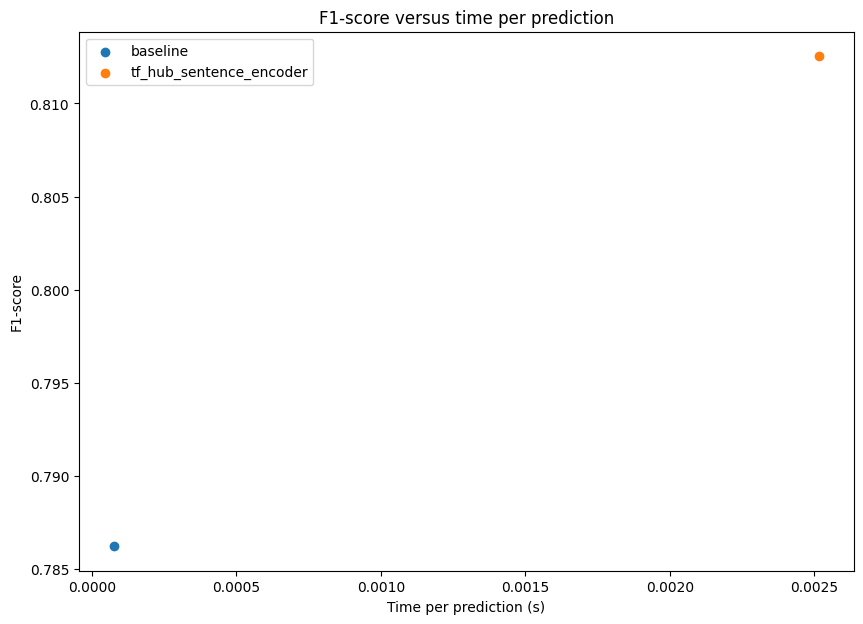

In [71]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,7))
plt.scatter(baseline_time_per_pred,baseline_results["f1"],label = "baseline")
plt.scatter(model_6_time_per_pred,model_6_results["f1"],label="tf_hub_sentence_encoder")
plt.legend()
plt.title("F1-score versus time per prediction")
plt.ylabel("F1-score")
plt.xlabel("Time per prediction (s)")

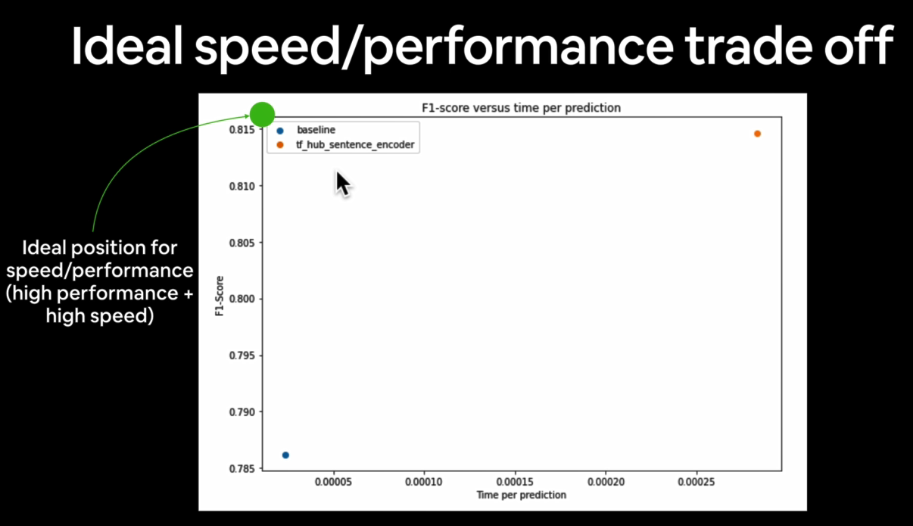

<body>
                <div class="container">
                <div class="row">
                <div class="col-md-10 col-md-offset-1">
                    <p class="lead"><p>Look at that! Massive effort building neural networks with TensorFlow for natural language processing (NLP) data.</p><p>You should now be able to:</p><ul><li><p>Diagnose different kinds of NLP (and NLU) problems</p></li><li><p>Build recurrent neural networks for text data</p></li><li><p>Use TensorFlow Hub for pretrained text embeddings</p></li><li><p>Evaluate a model's most wrong predictions</p></li></ul><p>Before you move onto the next section, I'd encourage you to check out and work through the exercises and extra-curriculum.</p><p>In the <a href="https://github.com/mrdbourke/tensorflow-deep-learning" rel="noopener noreferrer" target="_blank">course GitHub repo</a> under “Course materials”, you'll find a series of exercises and extra-curriculum suggestions.</p><p>See the link below for more.</p><ul><li><p><a href="https://github.com/mrdbourke/tensorflow-deep-learning#-08-introduction-to-nlp-natural-language-processing-in-tensorflow-exercises" rel="noopener noreferrer" target="_blank">Introduction to NLP fundamentals with TensorFlow exercises and extra-curriculum</a></p></li></ul><p>If you have any questions, be sure to <a href="https://github.com/mrdbourke/tensorflow-deep-learning/discussions" rel="noopener noreferrer" target="_blank">add them to the discussions page</a>.</p><p>Finally, before you move onto the next section, I've got a challenge for you.</p><p><strong>Challenge:</strong> Pick a Tweet from someone you follow on Twitter (can be about anything) as well as a Tweet about a disaster and run them both through the best performing model we trained in the notebook. Does the model predict the right classification (disaster or not disaster)?</p><p>I'd love to see what you find.</p><p>Send a message to the #machinelearning-datascience channel on Discord and mention my name (@mrdbourke).</p><p>Time to put what we've learned about the fundamentals of NLP to work in Milestone Project 2: SkimLit 📄🔥!</p><p>- Daniel</p><p>Web: <a href="http://www.mrdbourke.com/" rel="noopener noreferrer" target="_blank">www.mrdbourke.com</a></p><p>YouTube: <a href="https://dbourke.link/youtube" rel="noopener noreferrer" target="_blank">https://dbourke.link/youtube</a></p></p>
                </div>
                </div>
                </div>
                <script src="https://maxcdn.bootstrapcdn.com/bootstrap/3.3.7/js/bootstrap.min.js" integrity="sha384-Tc5IQib027qvyjSMfHjOMaLkfuWVxZxUPnCJA7l2mCWNIpG9mGCD8wGNIcPD7Txa" crossorigin="anonymous"></script>
                </body>